In [1]:
# AeroCNN-II with U-Net
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import datetime
%matplotlib inline

In [2]:
n_kernel=100
l2Regularizer=1e-09
kernel_size1 = 3
kernel_size2 = 3
#kernel_size3 = 5
n_grid = 128
strides1 = 1
strides2 = 2
lr = 5e-04
val_rate=0.2
test_rate=0.1
input_size = 100
batch_size = 20

In [3]:
main_directory = 'D:\\20221103aeroCNNII(-1to1)'
os.chdir(main_directory)

In [4]:
case_directory = 'offset0.25_validation'+str(val_rate)+'test'+str(test_rate)
if not os.path.exists(case_directory):
    os.makedirs(case_directory)
    
case_storage = main_directory+"\\"+case_directory

In [5]:
alpha = np.linspace(-10,20,16).reshape((-1,1))

In [6]:
aa = np.zeros((16*133,1))
for i in range(0, 133):
    aa[16*i:16*(i+1), :] = alpha[:,:]

In [7]:
aa = aa.reshape((133*16, 1, 1))

In [8]:
os.chdir('D:\\AeroCNN2Inputs')

In [9]:
origin = "D:\\20221103aeroCNNII(-1to1)\offset0.25"
origin_data = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"
origin_coord = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"

In [10]:
folders_orig = os.listdir(origin)
folders = [file for file in folders_orig if file.endswith('.csv')]

In [11]:
image_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + "_.csv"
        data = pd.read_csv(csv_file_name, header=None)
        image_df = pd.concat([image_df, data], axis=0)

In [12]:
image_np = image_df.iloc[:, :].values

In [13]:
image = image_np.reshape((133*16, 100, 100,1))

In [14]:
image = 1-image/100

In [15]:
path = 'D:\\airfoilFlowField'
file_list = os.listdir(path)
file_list_py = [file for file in file_list if file.endswith('.csv')]

In [16]:
file_name = origin_data + "\\AirfoilIndexList.xlsx"
airfoilName_df = pd.read_excel(file_name)
geometry_orig = airfoilName_df.iloc[:, 0].values

In [17]:
data_name = path + '\\' + str(geometry_orig[0]) + "alpha"+ str(int(alpha[1])) + "_interpolated.csv"
print(data_name)

D:\airfoilFlowField\airfoil1alpha-8_interpolated.csv


In [18]:
path = 'D:\\rotatedInterpolation_pow2\\n_grid128(-1to1)offset0.25\\velocityMagnitudeField'

In [19]:
Vmag_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        data_name = path + '\\' + str(geometry_orig[i-1]) + "alpha"+ str(int(alpha[j])) + "_velocityMagnitudeInterpolated.csv"
        data = pd.read_csv(data_name, header=None)
        Vmag_df = pd.concat([Vmag_df, data], axis=0)

In [20]:
geometry_orig = airfoilName_df.iloc[:, 1].values

In [21]:
y_imp = Vmag_df.iloc[:, :].values

In [22]:
y = y_imp.reshape((133*16, n_grid, n_grid, 1))

In [23]:
targetMax = np.max(y)
targetMin = np.min(y)

In [69]:
geometry = np.zeros((133*16,1))
geometry = geometry.astype(np.string_)
for i in geometry_orig:
    index_ = np.where(geometry_orig==i)
    for j in range(0,16):
        geometry[16*index_[0]+j,:] = np.asarray(i)

In [25]:
geometry.shape

(2128, 1)

In [26]:
geometry = geometry.reshape((133*16, 1))

In [70]:
x_all, x_test, aa_all, aa_test, geo_all, geo_test, y_all, y_test = train_test_split(
    image, aa, geometry, y, test_size=test_rate, random_state=1)

In [71]:
x_train, x_val, aa_train, aa_val, geo_train, geo_val, y_train, y_val = train_test_split(
    x_all, aa_all, geo_all, y_all, test_size=val_rate/(1-test_rate), random_state=1)

In [29]:
y_train_nor = (y_train-targetMin)/(targetMax-targetMin)

In [30]:
y_val_nor = (y_val-targetMin)/(targetMax-targetMin)

In [31]:
y_test_nor = (y_test-targetMin)/(targetMax-targetMin)

In [32]:
tf.keras.backend.set_image_data_format('channels_last')

In [34]:
input_image = tf.keras.Input(shape=(100, 100, 1))

x_conv1 = tf.keras.layers.Conv2D(n_kernel, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                 activation='relu', padding='same',
                                 kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                 name='Conv2DLayer1')(input_image)
x_maxpool1 = tf.keras.layers.MaxPooling2D((2,2))(x_conv1)
x_conv2 = tf.keras.layers.Conv2D(n_kernel*2, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                 activation='relu', padding='same',
                                 kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                 name='Conv2DLayer2')(x_maxpool1)
x_maxpool2 = tf.keras.layers.MaxPooling2D((2,2))(x_conv2)

x_deconv1 = tf.keras.layers.Conv2DTranspose(n_kernel*2, (kernel_size1, kernel_size1),
                                            strides = (strides2, strides2),
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            padding='same', activation='relu')(x_maxpool2)
x_concat1 = tf.concat([x_conv2, x_deconv1], axis=-1)
x_deconv2 = tf.keras.layers.Conv2DTranspose(n_kernel, (kernel_size1, kernel_size1),
                                            strides = (strides2, strides2),
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            padding='same', activation='relu')(x_concat1)
x_concat2 = tf.concat([x_conv1, x_deconv2], axis=-1)

output_impr = tf.keras.layers.Conv2D(1, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                     activation='relu', padding='same',
                                     kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                     name='Conv2Doutput')(x_concat2)
x_flat = tf.keras.layers.Flatten()(output_impr)
x_fc = tf.keras.layers.Dense(units=n_grid**2, activation='linear', name='outputLayer',
                             kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer))(x_flat)
output_data = tf.keras.layers.Reshape((n_grid, n_grid,1))(x_fc)
# CNN autoencoder
model = tf.keras.Model(input_image, output_data)

In [35]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 100, 100, 1  0           []                               
                                )]                                                                
                                                                                                  
 Conv2DLayer1 (Conv2D)          (None, 100, 100, 10  1000        ['input_2[0][0]']                
                                0)                                                                
                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 50, 50, 100)  0          ['Conv2DLayer1[0][0]']           
                                                                                              

In [36]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              loss = tf.keras.losses.MeanSquaredError(),
              metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [37]:
os.chdir(case_storage)

es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=100, min_delta=6e-7,
                                      restore_best_weights=True, verbose=1)
rp = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=70, factor=0.5,
                                          min_delta = 1e-07, min_lr=1e-05,
                                          verbose=1)

In [38]:
start = datetime.datetime.now()
history = model.fit(x_train, y_train_nor, validation_data=[x_val, y_val_nor], batch_size=batch_size,
                    epochs=5000, shuffle=True, callbacks=[es, rp])
end = datetime.datetime.now()

Epoch 1/5000
75/75 [==============================] - 9s 63ms/step - loss: 0.0180 - rmse: 0.1342 - val_loss: 0.0016 - val_rmse: 0.0396 - lr: 5.0000e-04
Epoch 2/5000
75/75 [==============================] - 4s 51ms/step - loss: 0.0011 - rmse: 0.0326 - val_loss: 8.1993e-04 - val_rmse: 0.0284 - lr: 5.0000e-04
Epoch 3/5000
75/75 [==============================] - 4s 51ms/step - loss: 7.6611e-04 - rmse: 0.0274 - val_loss: 6.7571e-04 - val_rmse: 0.0257 - lr: 5.0000e-04
Epoch 4/5000
75/75 [==============================] - 4s 51ms/step - loss: 6.5571e-04 - rmse: 0.0253 - val_loss: 5.9309e-04 - val_rmse: 0.0241 - lr: 5.0000e-04
Epoch 5/5000
75/75 [==============================] - 4s 51ms/step - loss: 5.8960e-04 - rmse: 0.0240 - val_loss: 5.4944e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 6/5000
75/75 [==============================] - 4s 51ms/step - loss: 5.3977e-04 - rmse: 0.0229 - val_loss: 5.4597e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 7/5000
75/75 [==============================] 

75/75 [==============================] - 4s 48ms/step - loss: 2.8825e-04 - rmse: 0.0166 - val_loss: 3.6503e-04 - val_rmse: 0.0188 - lr: 5.0000e-04
Epoch 53/5000
75/75 [==============================] - 4s 48ms/step - loss: 2.8375e-04 - rmse: 0.0164 - val_loss: 3.3897e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 54/5000
75/75 [==============================] - 4s 48ms/step - loss: 2.7861e-04 - rmse: 0.0163 - val_loss: 3.3581e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 55/5000
75/75 [==============================] - 4s 47ms/step - loss: 2.7891e-04 - rmse: 0.0163 - val_loss: 3.4473e-04 - val_rmse: 0.0182 - lr: 5.0000e-04
Epoch 56/5000
75/75 [==============================] - 4s 47ms/step - loss: 2.7545e-04 - rmse: 0.0162 - val_loss: 3.3711e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 57/5000
75/75 [==============================] - 4s 47ms/step - loss: 2.7168e-04 - rmse: 0.0161 - val_loss: 3.6809e-04 - val_rmse: 0.0188 - lr: 5.0000e-04
Epoch 58/5000
75/75 [===========================

Epoch 103/5000
75/75 [==============================] - 4s 47ms/step - loss: 1.9740e-04 - rmse: 0.0136 - val_loss: 3.1127e-04 - val_rmse: 0.0173 - lr: 5.0000e-04
Epoch 104/5000
75/75 [==============================] - 4s 47ms/step - loss: 1.8825e-04 - rmse: 0.0132 - val_loss: 3.1679e-04 - val_rmse: 0.0174 - lr: 5.0000e-04
Epoch 105/5000
75/75 [==============================] - 4s 47ms/step - loss: 1.8898e-04 - rmse: 0.0133 - val_loss: 3.0959e-04 - val_rmse: 0.0172 - lr: 5.0000e-04
Epoch 106/5000
75/75 [==============================] - 4s 47ms/step - loss: 1.9332e-04 - rmse: 0.0134 - val_loss: 3.2127e-04 - val_rmse: 0.0176 - lr: 5.0000e-04
Epoch 107/5000
75/75 [==============================] - 4s 51ms/step - loss: 1.8275e-04 - rmse: 0.0130 - val_loss: 3.0695e-04 - val_rmse: 0.0171 - lr: 5.0000e-04
Epoch 108/5000
75/75 [==============================] - 4s 47ms/step - loss: 1.8108e-04 - rmse: 0.0130 - val_loss: 3.0938e-04 - val_rmse: 0.0172 - lr: 5.0000e-04
Epoch 109/5000
75/75 [======

75/75 [==============================] - 4s 47ms/step - loss: 1.3071e-04 - rmse: 0.0108 - val_loss: 3.1328e-04 - val_rmse: 0.0173 - lr: 5.0000e-04
Epoch 154/5000
75/75 [==============================] - 4s 47ms/step - loss: 1.2175e-04 - rmse: 0.0104 - val_loss: 3.1846e-04 - val_rmse: 0.0175 - lr: 5.0000e-04
Epoch 155/5000
75/75 [==============================] - 4s 47ms/step - loss: 1.1933e-04 - rmse: 0.0103 - val_loss: 3.1659e-04 - val_rmse: 0.0174 - lr: 5.0000e-04
Epoch 156/5000
75/75 [==============================] - 4s 47ms/step - loss: 1.1970e-04 - rmse: 0.0103 - val_loss: 3.2176e-04 - val_rmse: 0.0176 - lr: 5.0000e-04
Epoch 157/5000
75/75 [==============================] - 4s 47ms/step - loss: 1.1622e-04 - rmse: 0.0102 - val_loss: 3.1986e-04 - val_rmse: 0.0175 - lr: 5.0000e-04
Epoch 158/5000
75/75 [==============================] - 4s 47ms/step - loss: 1.2370e-04 - rmse: 0.0105 - val_loss: 3.2582e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 159/5000
75/75 [=====================

Epoch 203/5000
75/75 [==============================] - 4s 47ms/step - loss: 7.7690e-05 - rmse: 0.0081 - val_loss: 3.1899e-04 - val_rmse: 0.0175 - lr: 2.5000e-04
Epoch 204/5000
75/75 [==============================] - 4s 47ms/step - loss: 7.7582e-05 - rmse: 0.0081 - val_loss: 3.2094e-04 - val_rmse: 0.0176 - lr: 2.5000e-04
Epoch 205/5000
75/75 [==============================] - 4s 47ms/step - loss: 7.6534e-05 - rmse: 0.0080 - val_loss: 3.1895e-04 - val_rmse: 0.0175 - lr: 2.5000e-04
Epoch 206/5000
75/75 [==============================] - 4s 47ms/step - loss: 7.5976e-05 - rmse: 0.0080 - val_loss: 3.2561e-04 - val_rmse: 0.0177 - lr: 2.5000e-04
Epoch 207/5000
75/75 [==============================] - 4s 47ms/step - loss: 7.7616e-05 - rmse: 0.0081 - val_loss: 3.2087e-04 - val_rmse: 0.0176 - lr: 2.5000e-04
Epoch 208/5000
75/75 [==============================] - 4s 47ms/step - loss: 7.6695e-05 - rmse: 0.0080 - val_loss: 3.2170e-04 - val_rmse: 0.0176 - lr: 2.5000e-04
Epoch 209/5000
75/75 [======

In [39]:
time = end - start
print("Training time:", time)

Training time: 0:12:53.933221


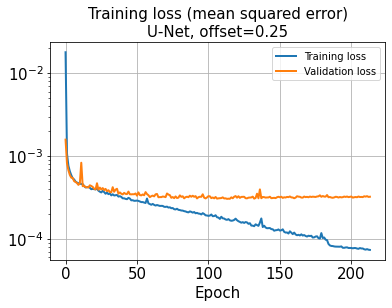

In [40]:
hist = history.history
plt.plot(hist['loss'], lw=2)
plt.plot(hist['val_loss'], lw=2)
plt.title('Training loss (mean squared error)\nU-Net, offset=0.25', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
#plt.ylim([5e-5, 1e-1])
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(['Training loss', 'Validation loss'])
plt.grid()
saveName = case_storage + "\\TrainingLoss_val" + str(val_rate) + "test"+str(test_rate) + "_offset0.25.jpg"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

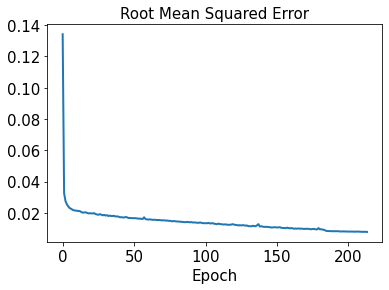

In [41]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

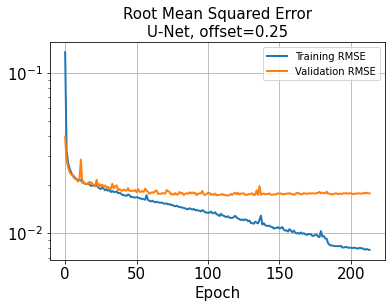

In [42]:
plt.plot(hist['rmse'], lw=2)
plt.plot(hist['val_rmse'], lw=2)
plt.title('Root Mean Squared Error\nU-Net, offset=0.25', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(['Training RMSE', 'Validation RMSE'])
plt.grid()
saveName = case_storage + "\\RMSE_val" + str(val_rate) + "test"+str(test_rate) + "_offset0.25.jpg"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [43]:
test_results = model.evaluate(x_test)

7/7 [==============================] - 0s 4ms/step - loss: 1.3114e-05 - rmse: 0.0000e+00


In [44]:
decoded_train_nor = model.predict(x_train)
decoded_val_nor = model.predict(x_val)
decoded_test_nor = model.predict(x_test)

7/7 [==============================] - 0s 32ms/step


In [45]:
decoded_train = decoded_train_nor*(targetMax-targetMin) + targetMin
decoded_val = decoded_val_nor*(targetMax-targetMin) + targetMin
decoded_test = decoded_test_nor*(targetMax-targetMin) + targetMin

In [46]:
os.chdir("D:\\TrainedModels\\20221103")
model_name = "20221103AeroCNN-II_UNet_FlowField_offset0.25_val" + str(val_rate) + "test"+str(test_rate)+".h5"
model.save(model_name, overwrite=True, include_optimizer=True, save_format='h5')

In [47]:
error_train_abs = np.abs(decoded_train - y_train)

In [48]:
error_val_abs = np.abs(decoded_val - y_val)

In [49]:
error_test_abs = np.abs(decoded_test - y_test)

In [50]:
l2_error_train = np.sqrt(np.sum((decoded_train - y_train)**2) / np.sum(y_train**2))
print(l2_error_train)

0.03189861343138312


In [51]:
l2_error_val = np.sqrt(np.sum((decoded_val - y_val)**2) / np.sum(y_val**2))
print(l2_error_val)

0.0457769418509587


In [52]:
l2_error_test = np.sqrt(np.sum((decoded_test - y_test)**2) / np.sum(y_test**2))
print(l2_error_test)

0.04803319519986971


In [53]:
l2_error_train_list = []
for i in range(0, len(aa_train)):
    l2_error_train_data = np.sqrt(np.sum((decoded_train[i] - y_train[i])**2) / np.sum(y_train[i]**2))
    l2_error_train_list.append(l2_error_train_data)

In [54]:
l2_error_val_list = []
for i in range(0, len(aa_val)):
    l2_error_val_data = np.sqrt(np.sum((decoded_val[i] - y_val[i])**2) / np.sum(y_val[i]**2))
    l2_error_val_list.append(l2_error_val_data)

In [55]:
l2_error_test_list = []
for i in range(0, len(aa_test)):
    l2_error_test_data = np.sqrt(np.sum((decoded_test[i] - y_test[i])**2) / np.sum(y_test[i]**2))
    l2_error_test_list.append(l2_error_test_data)

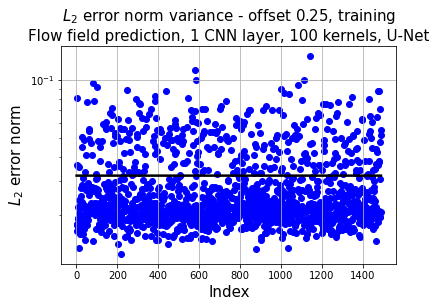

In [56]:
plt.plot(np.linspace(1, aa_train.shape[0], aa_train.shape[0]),
         l2_error_train*np.ones(aa_train.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_train.shape[0], aa_train.shape[0]), l2_error_train_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - offset 0.25, training\nFlow field prediction, 1 CNN layer, 100 kernels, U-Net', fontsize=15)
plt.grid()
saveName = case_storage + "\\trainingErrorDistribution"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

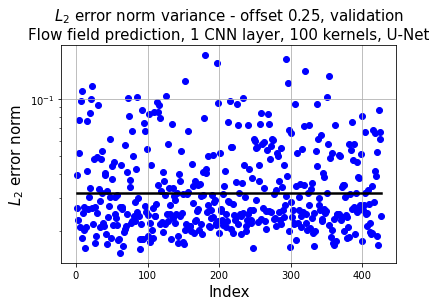

In [57]:
plt.plot(np.linspace(1, aa_val.shape[0], aa_val.shape[0]),
         l2_error_train*np.ones(aa_val.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_val.shape[0], aa_val.shape[0]), l2_error_val_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - offset 0.25, validation\nFlow field prediction, 1 CNN layer, 100 kernels, U-Net', fontsize=15)
plt.grid()
saveName = case_storage + "\\validationErrorDistribution"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

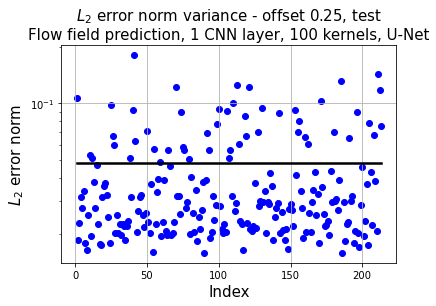

In [58]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - offset 0.25, test\nFlow field prediction, 1 CNN layer, 100 kernels, U-Net', fontsize=15)
plt.grid()
saveName = case_storage + "\\testErrorDistribution"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [82]:
os.chdir("D:\\20221103aeroCNNII(-1to1)\\offset0.25_validation0.2test0.1\\UNet")

In [83]:
xrange = np.linspace(-1, 1, n_grid)
yrange = np.linspace(-1, 1, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

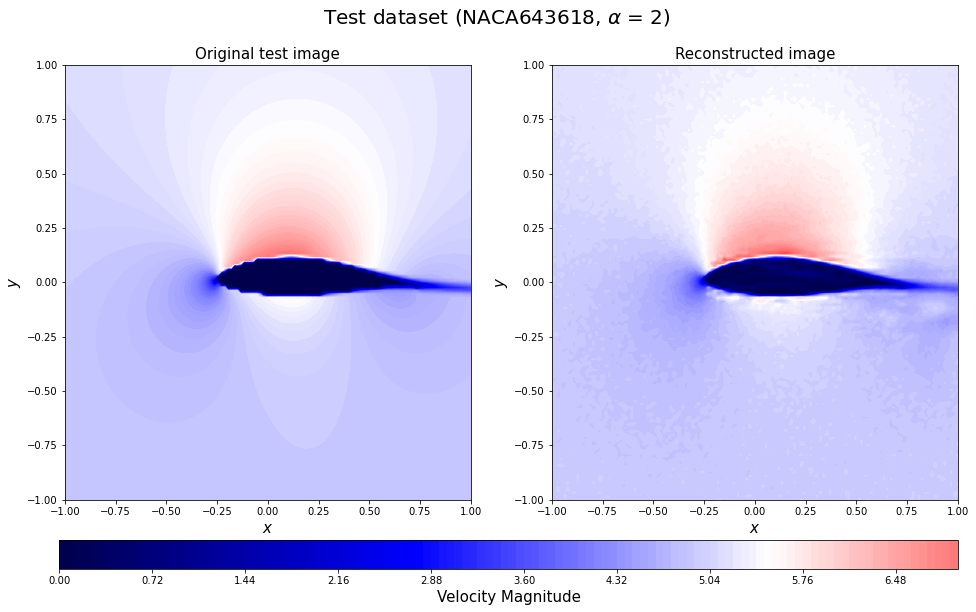

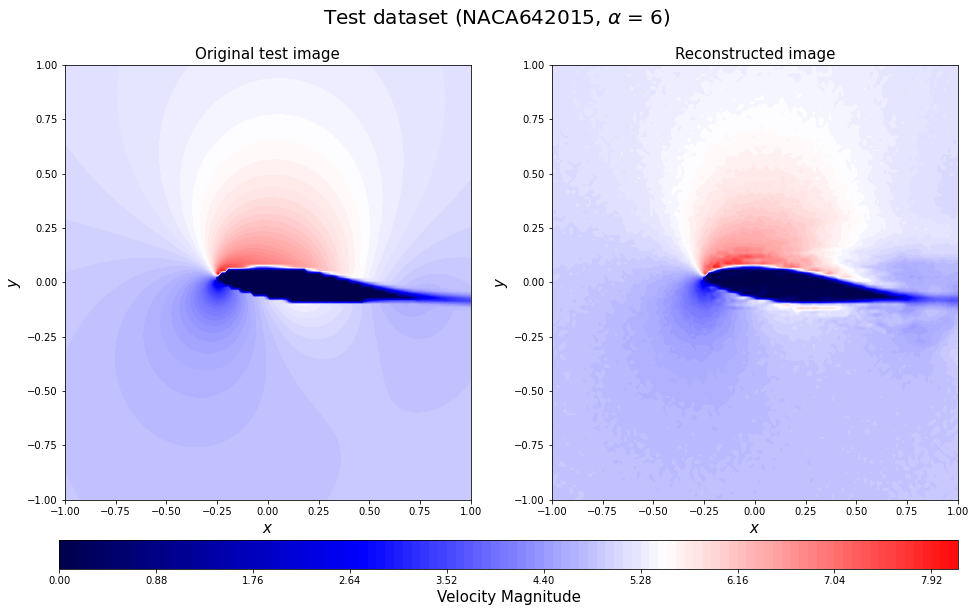

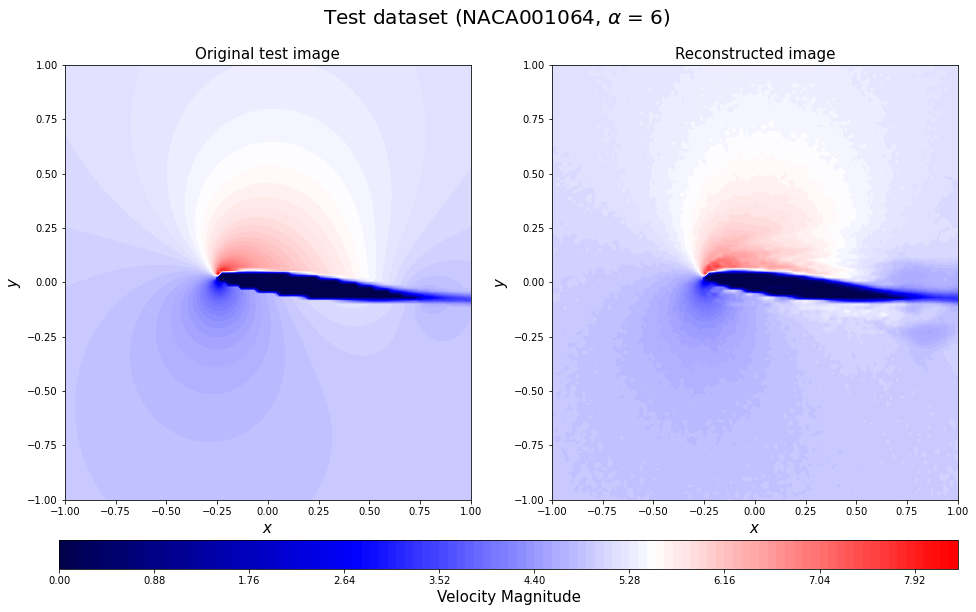

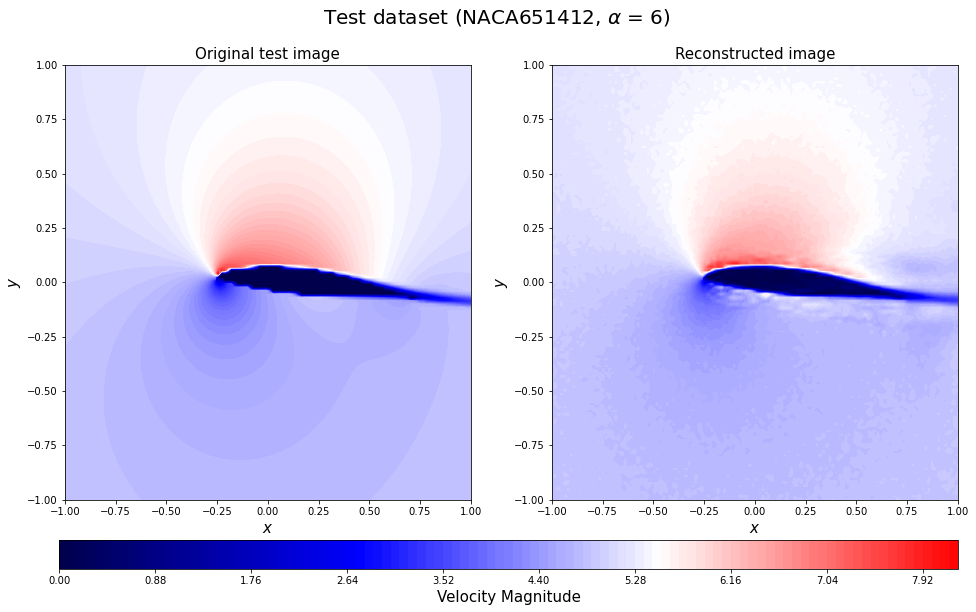

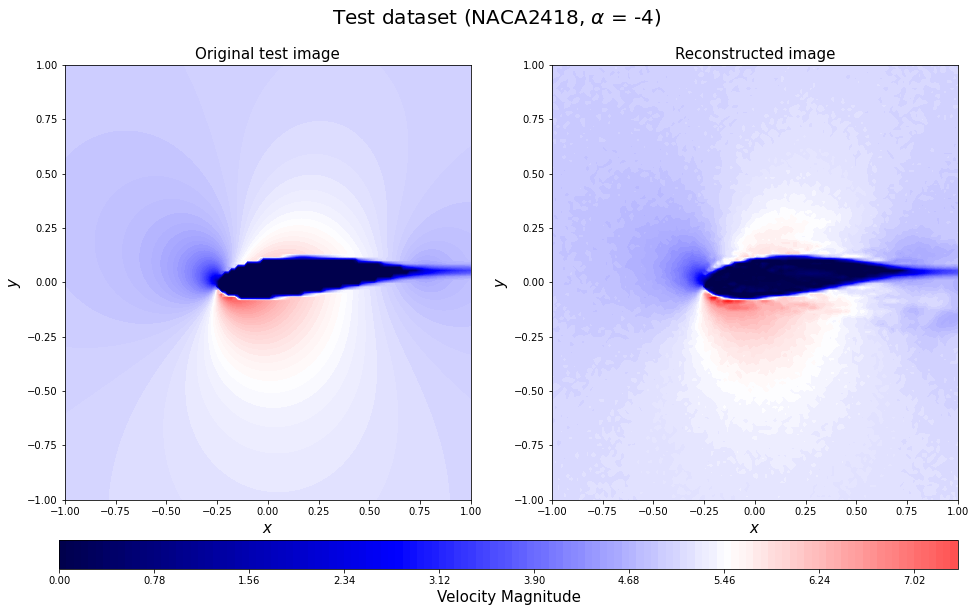

...

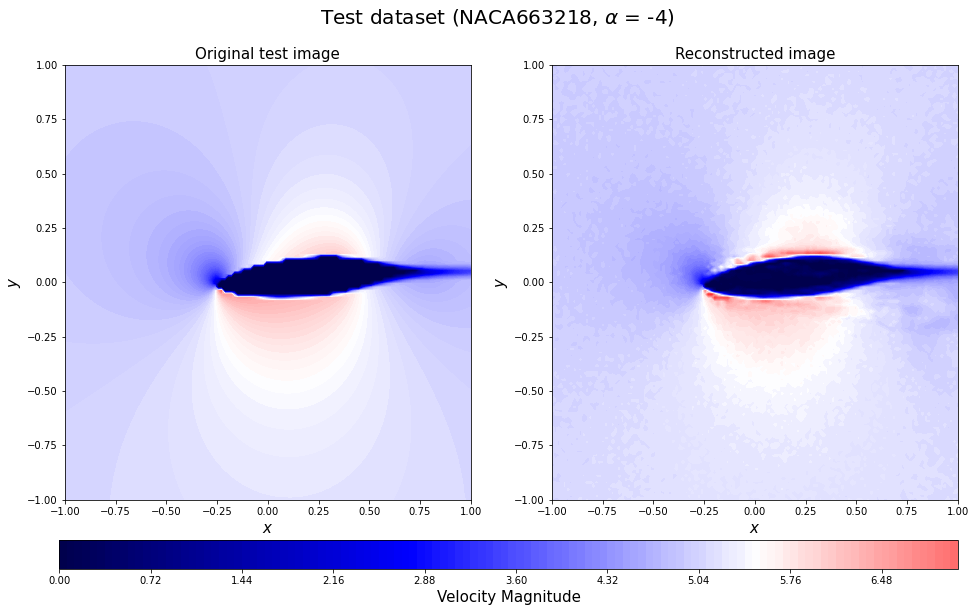

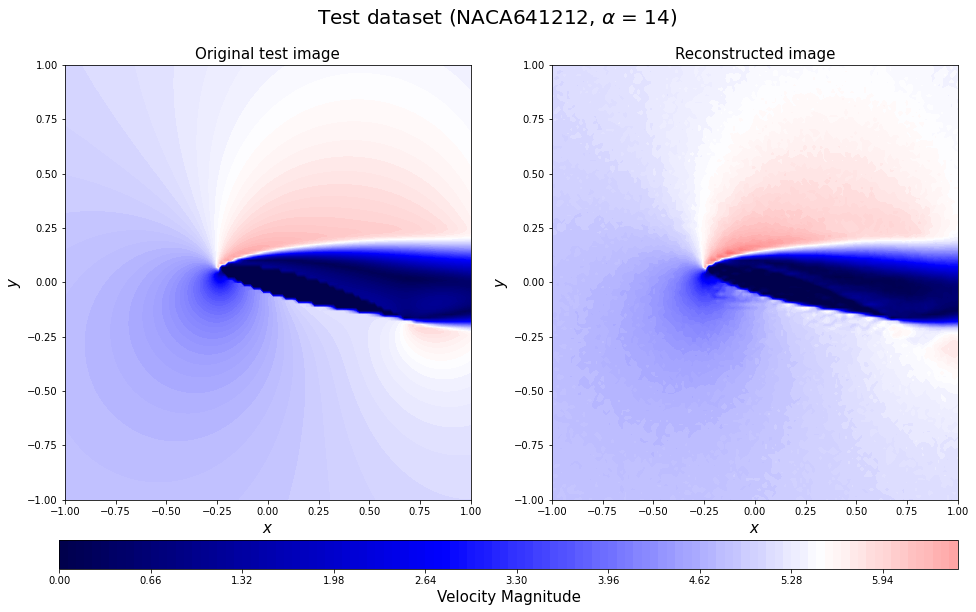

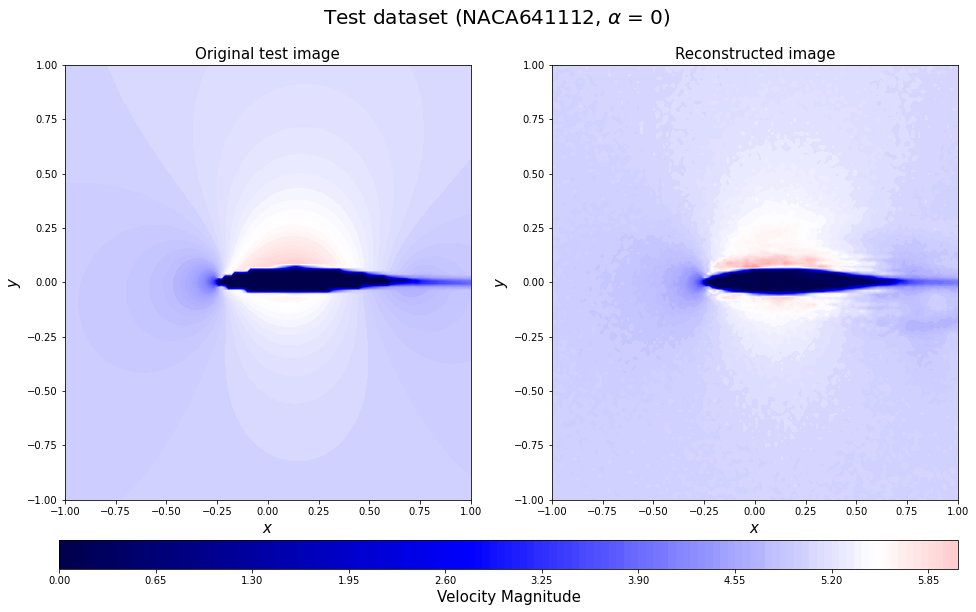

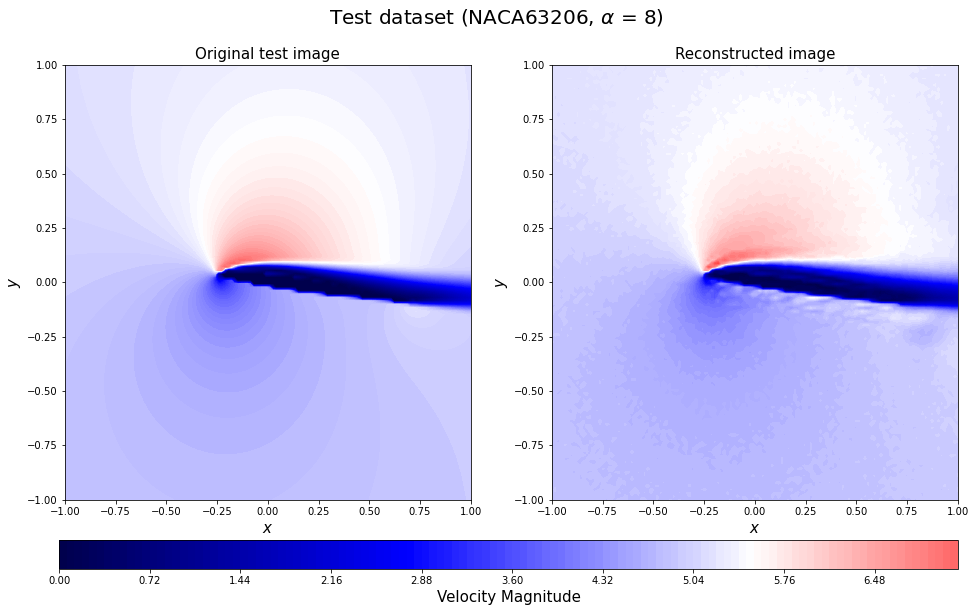

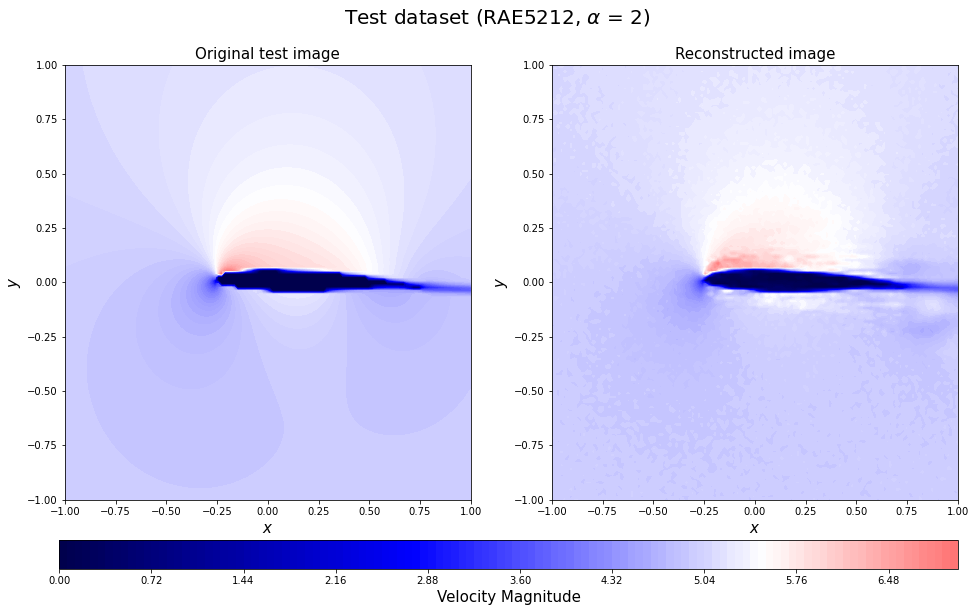

In [84]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test2_rotate = y_test[2*16+c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_test[2*16+c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test2_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[2*16+c])[3:-2], aa_test[2*16+c]),fontsize=20)
    save_fig_name = "20221107Prediction_UNet(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

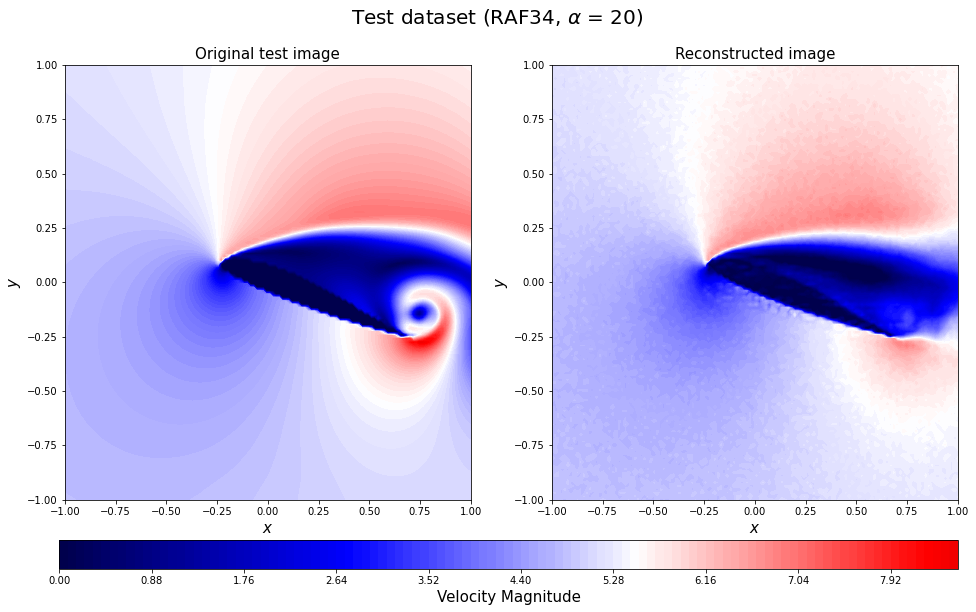

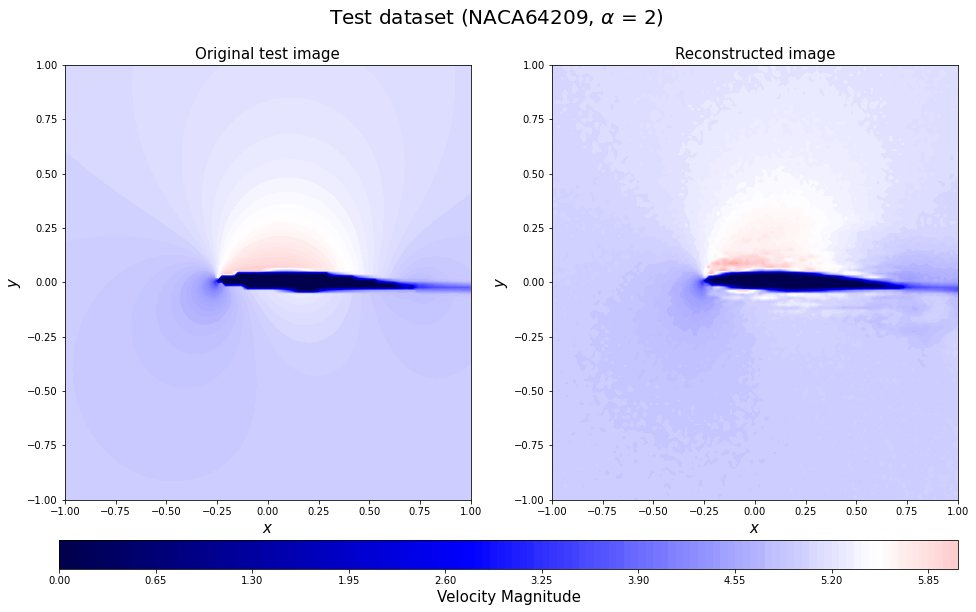

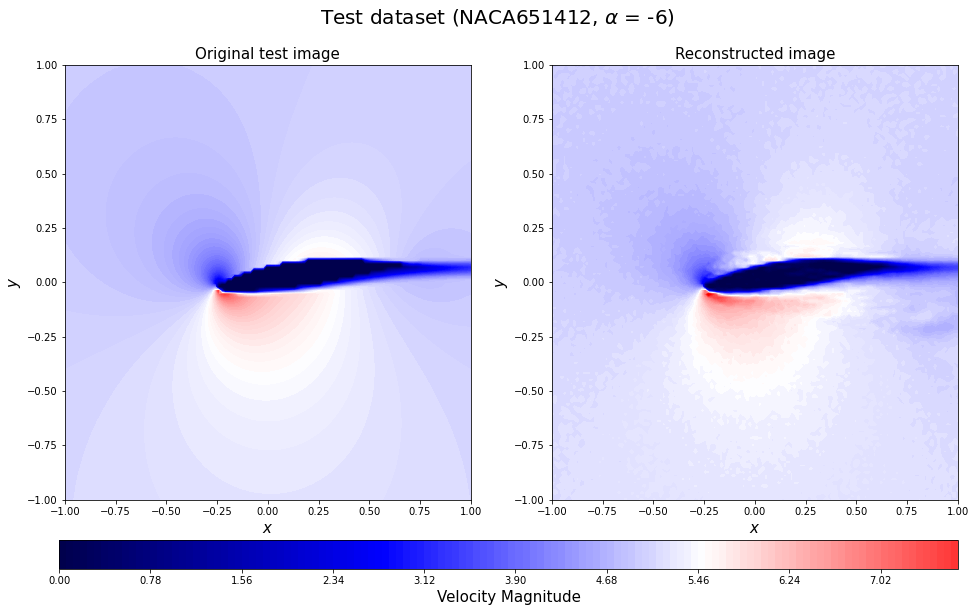

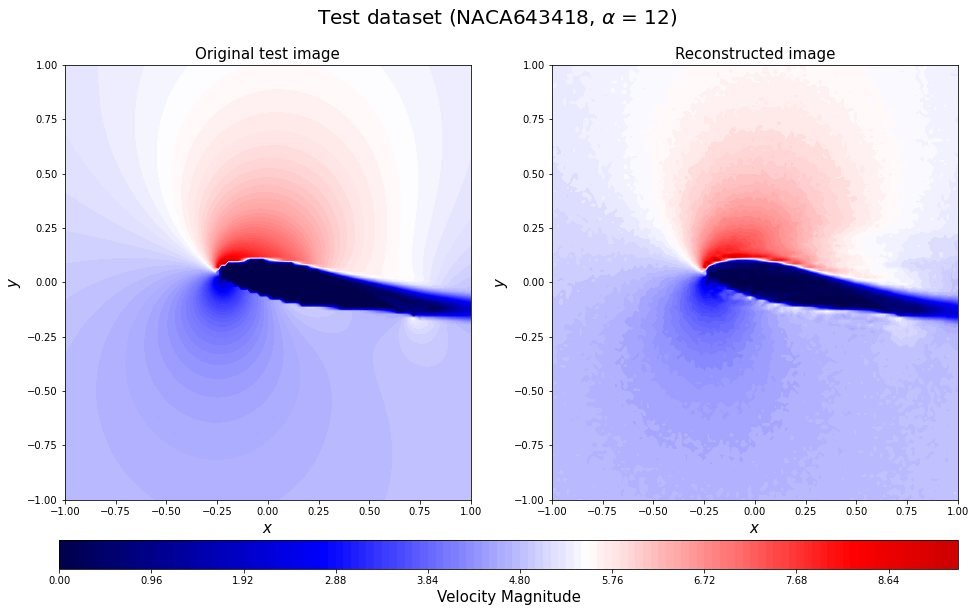

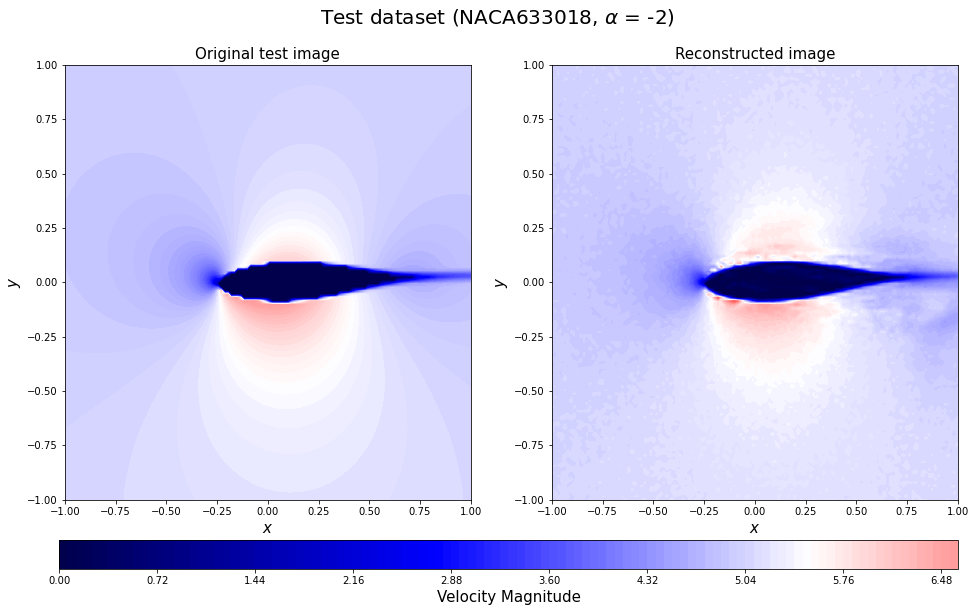

...

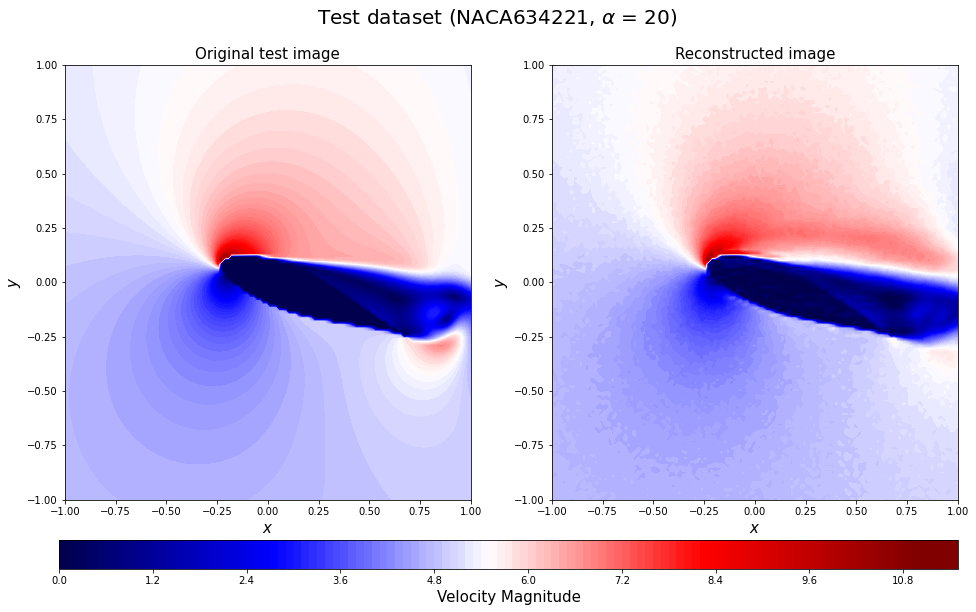

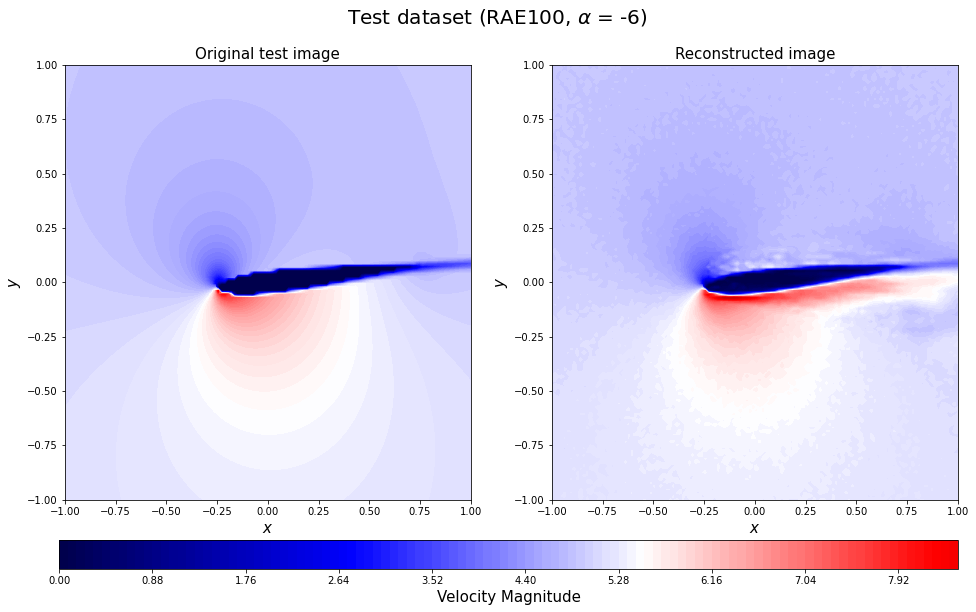

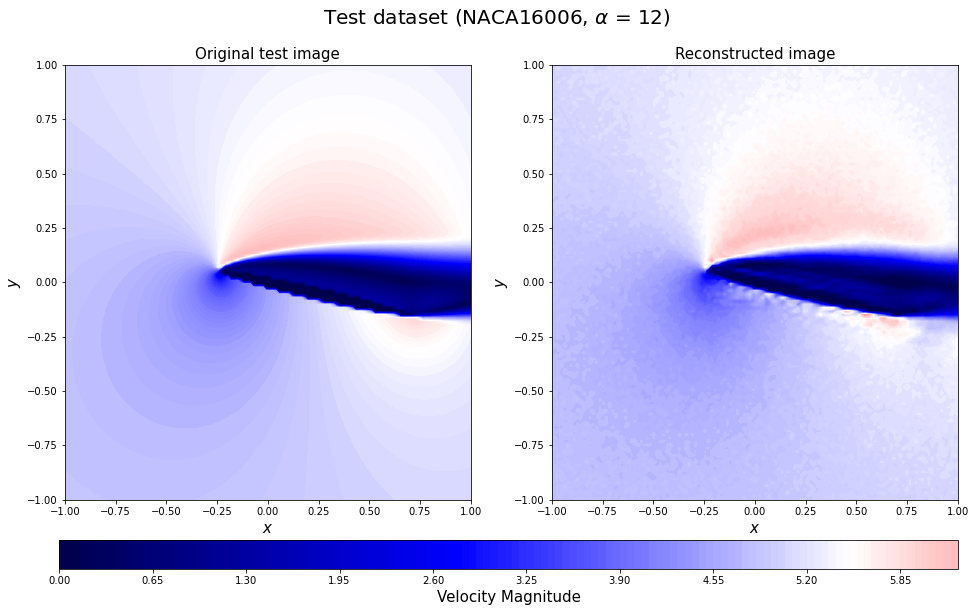

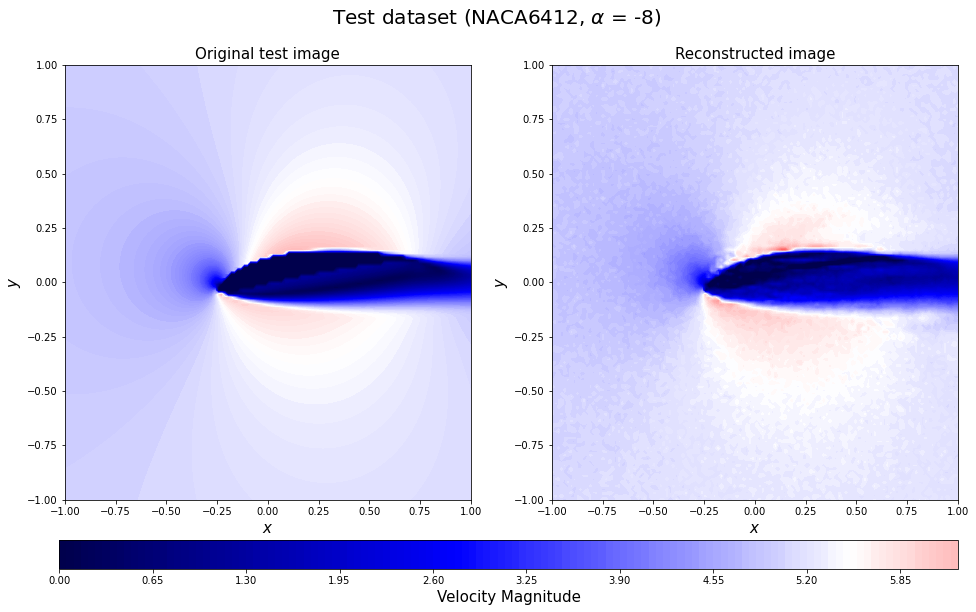

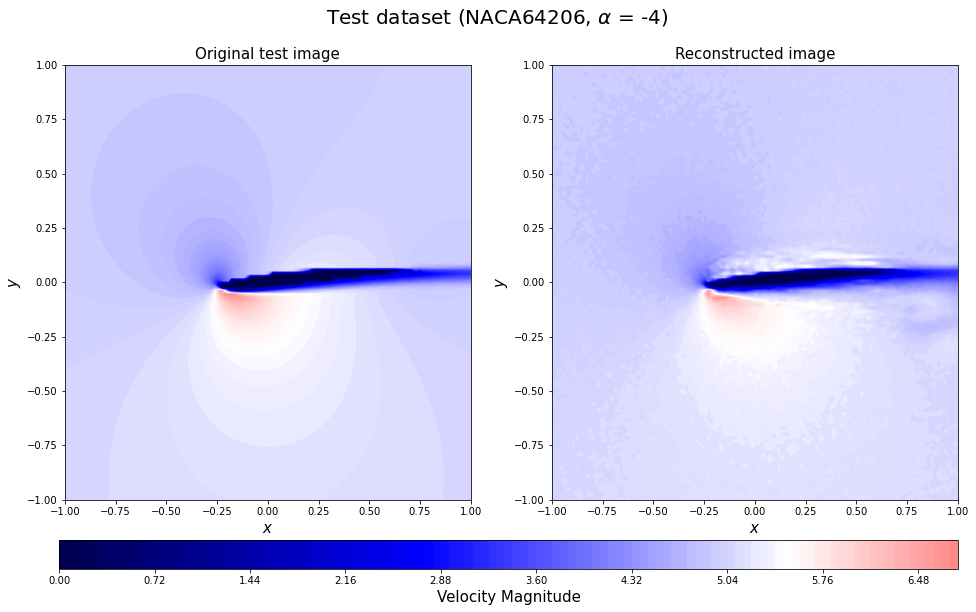

In [85]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221107Prediction_UNet(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

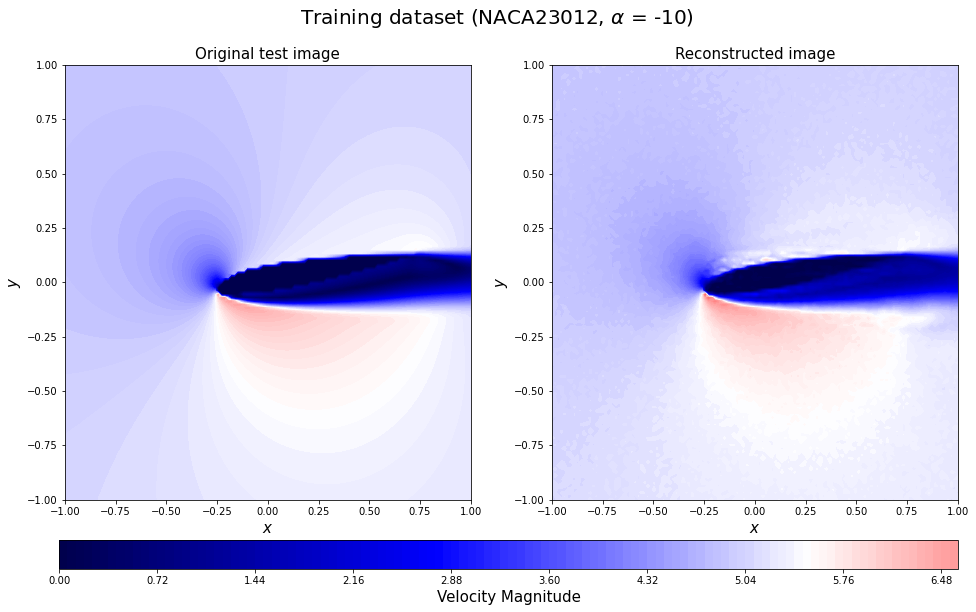

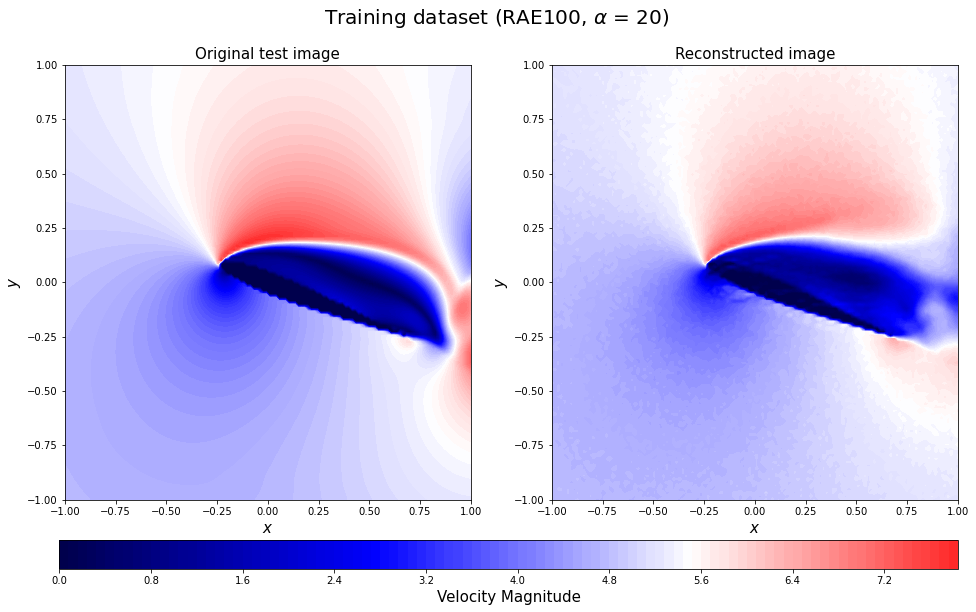

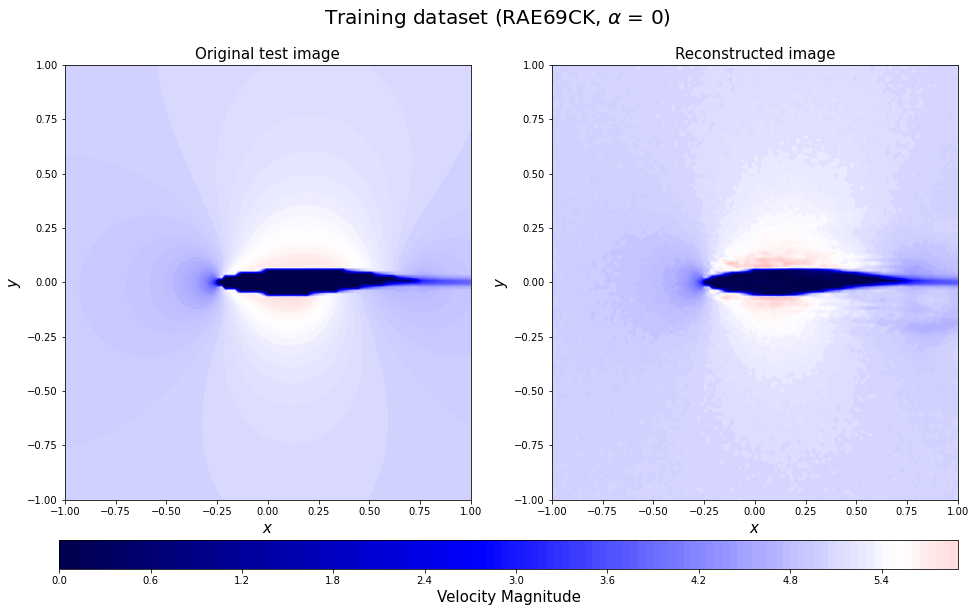

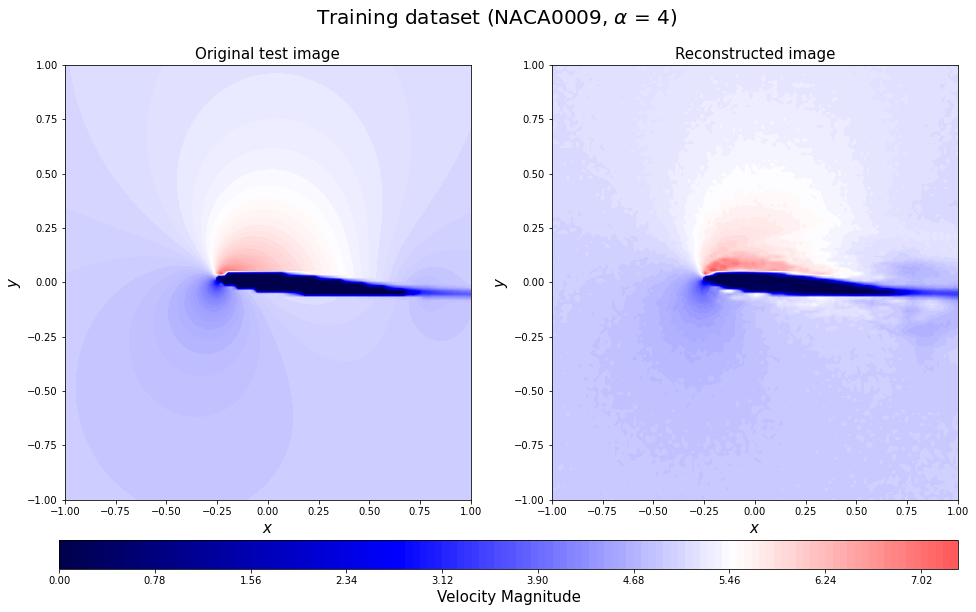

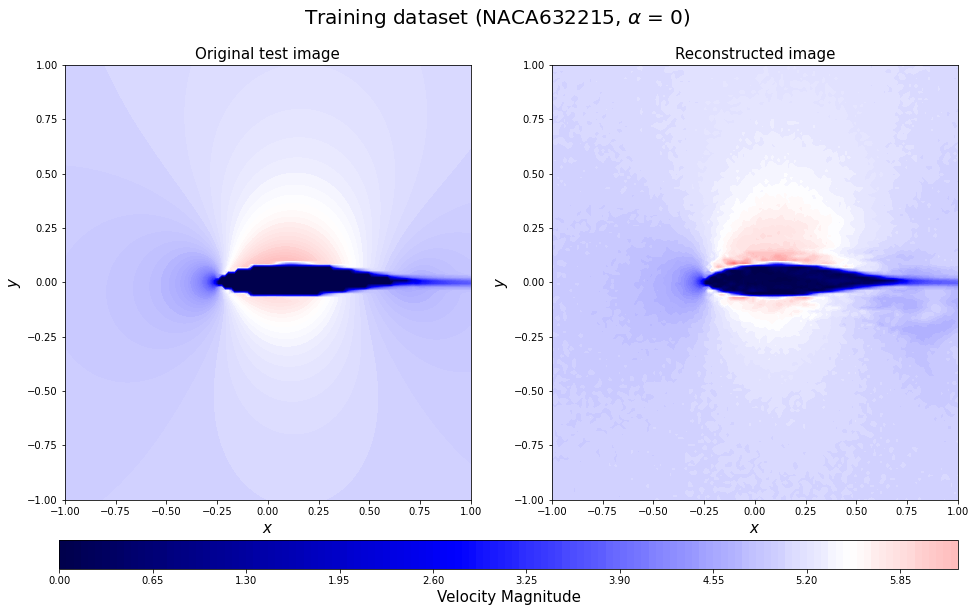

...

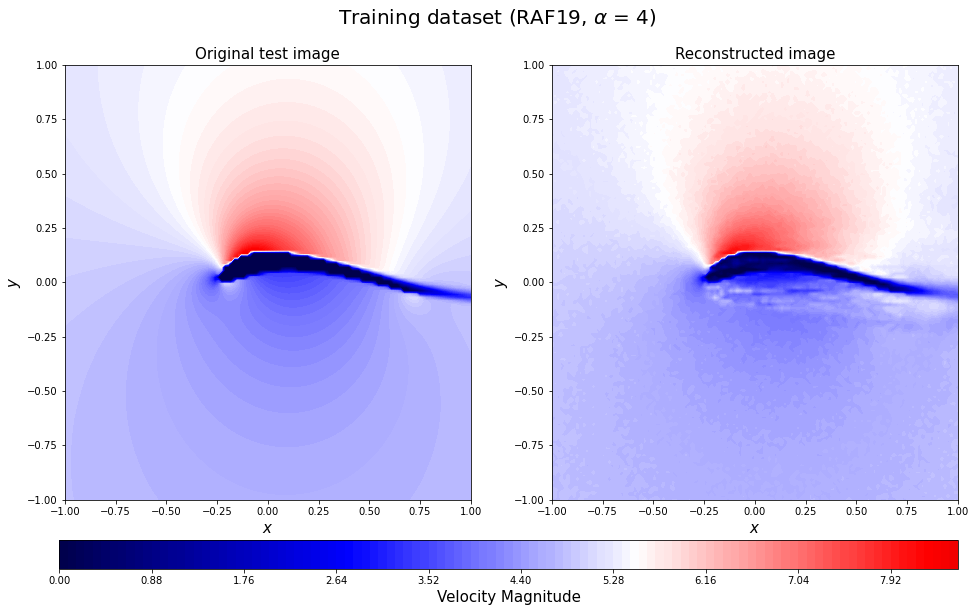

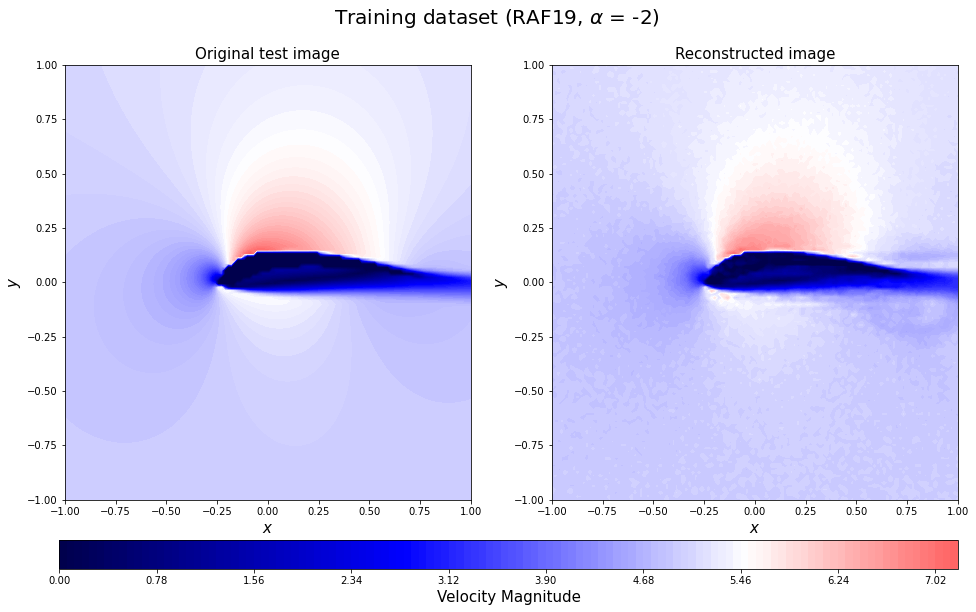

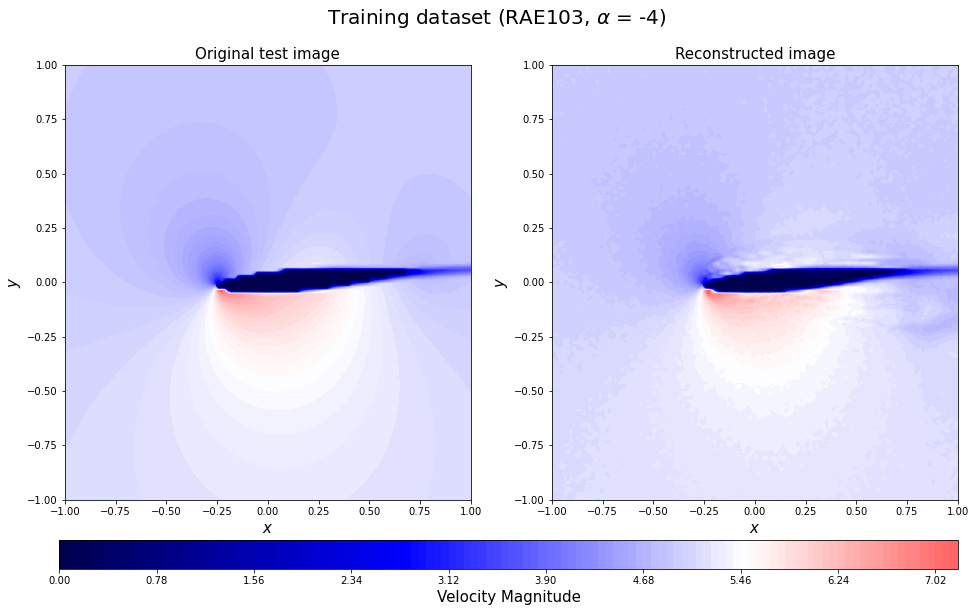

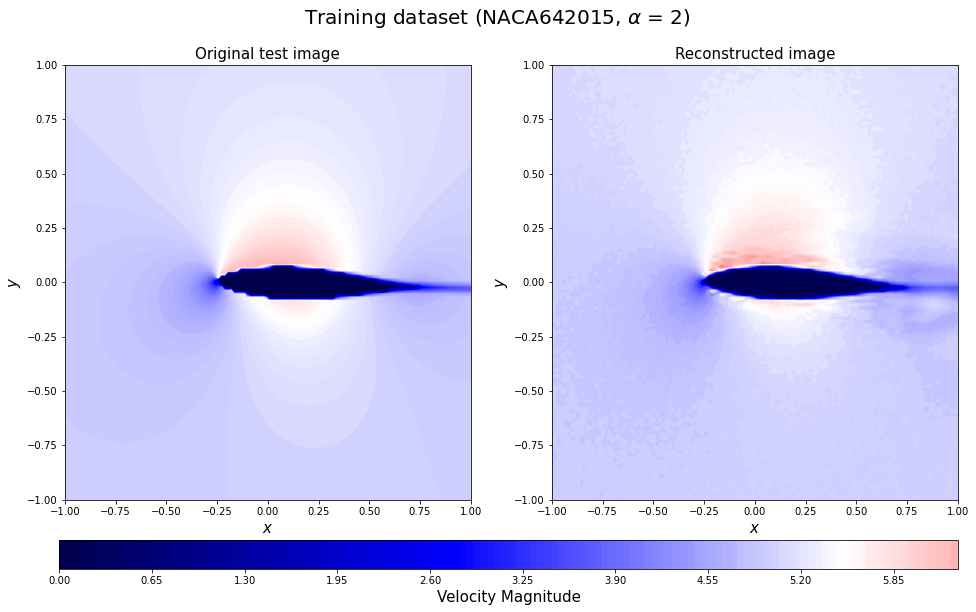

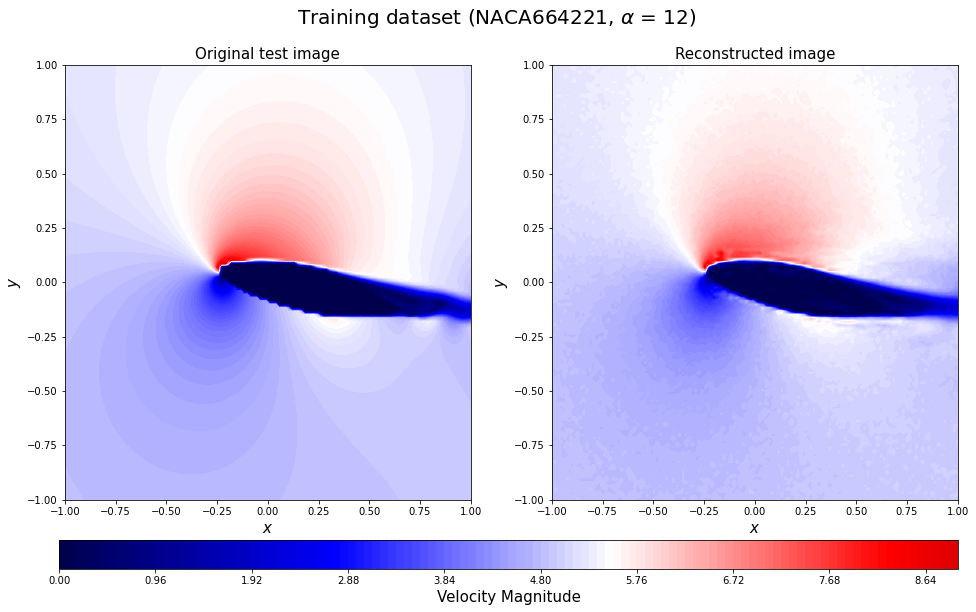

In [86]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train0_rotate = y_train[c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_train[c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train0_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[c])[3:-2], aa_train[c]),fontsize=20)
    save_fig_name = "20221107Prediction_UNet(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

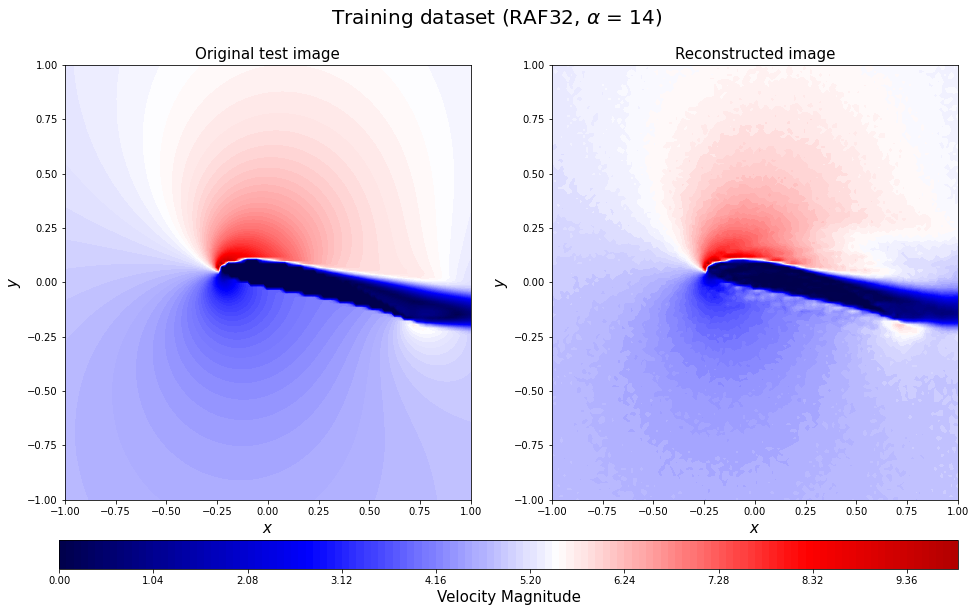

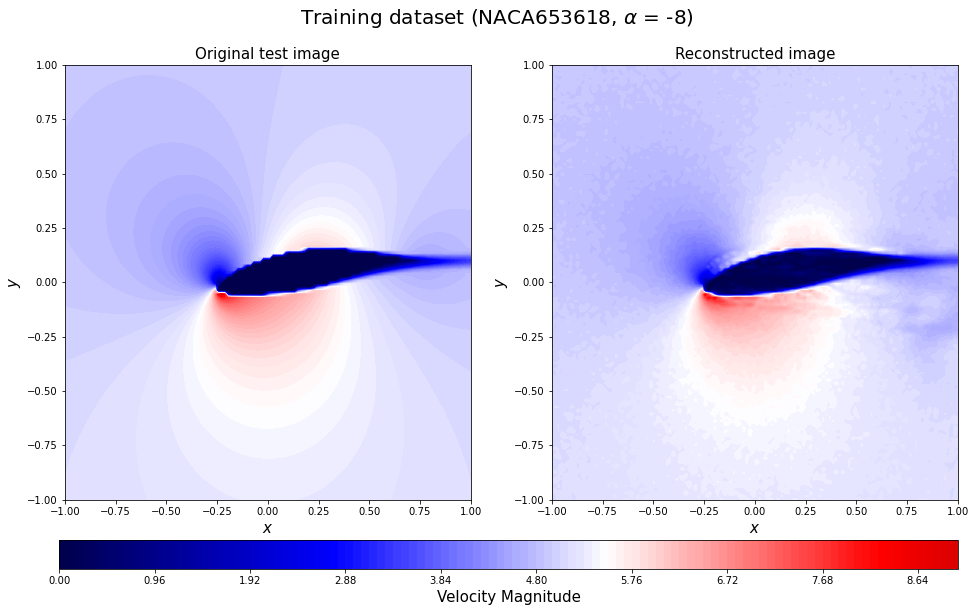

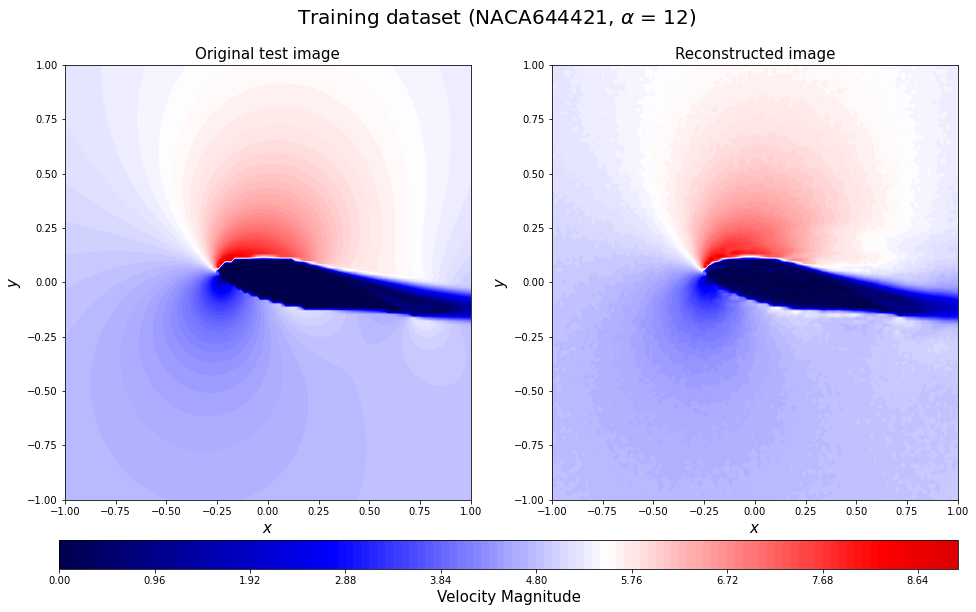

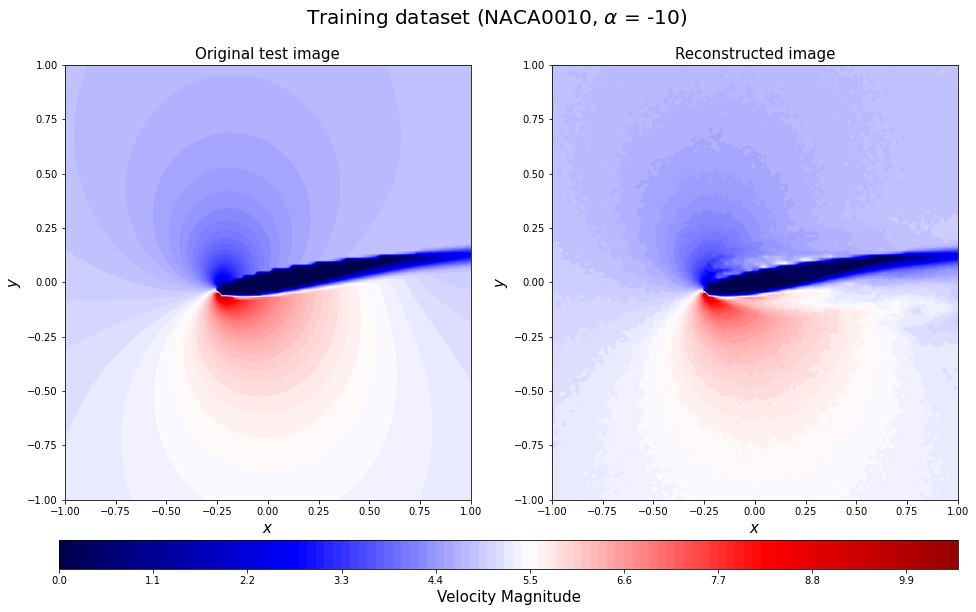

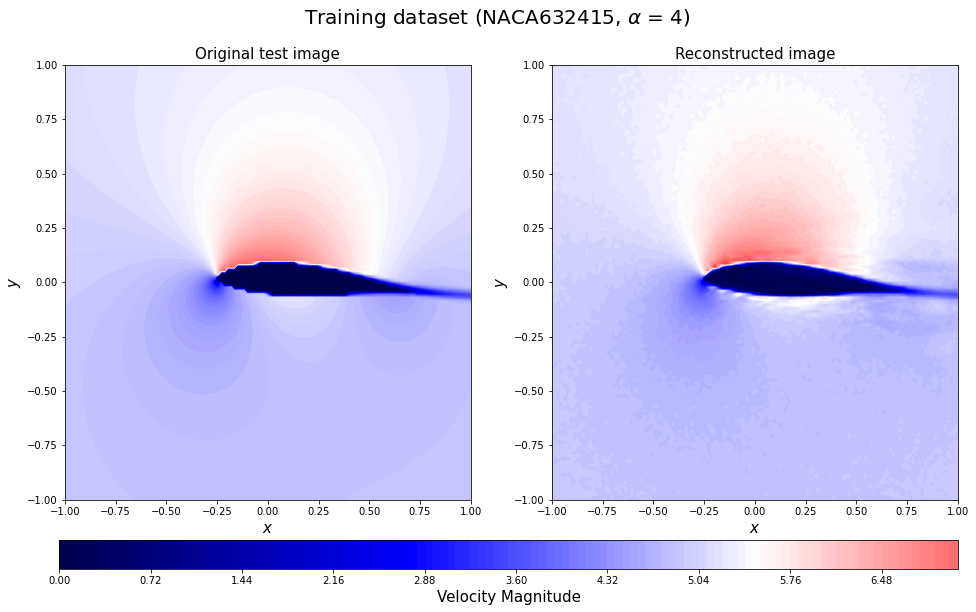

...

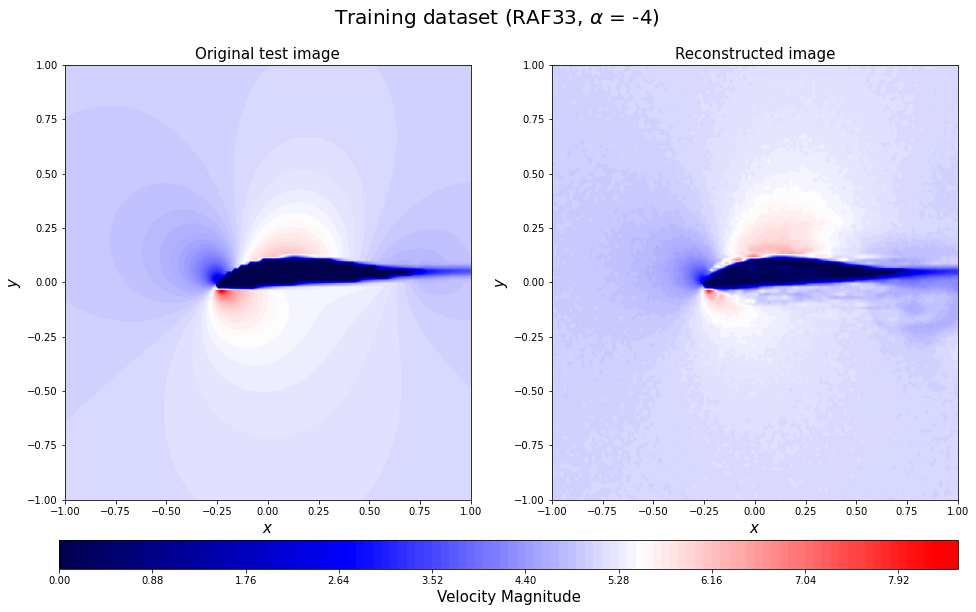

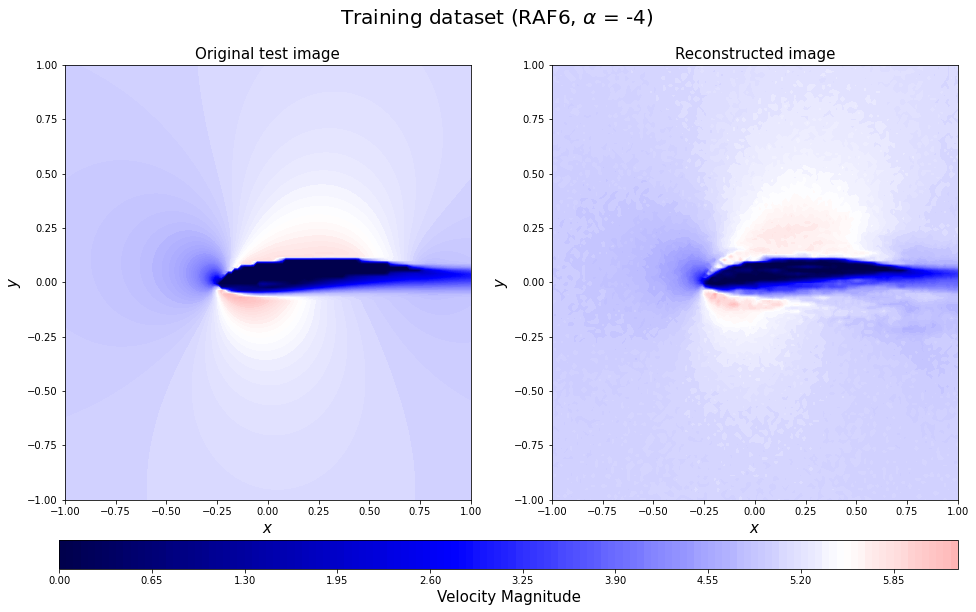

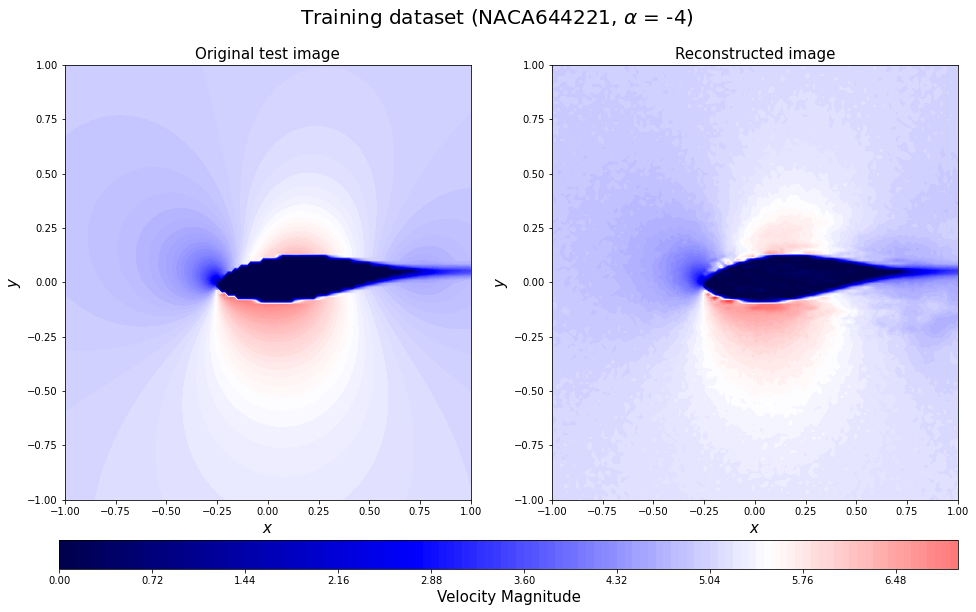

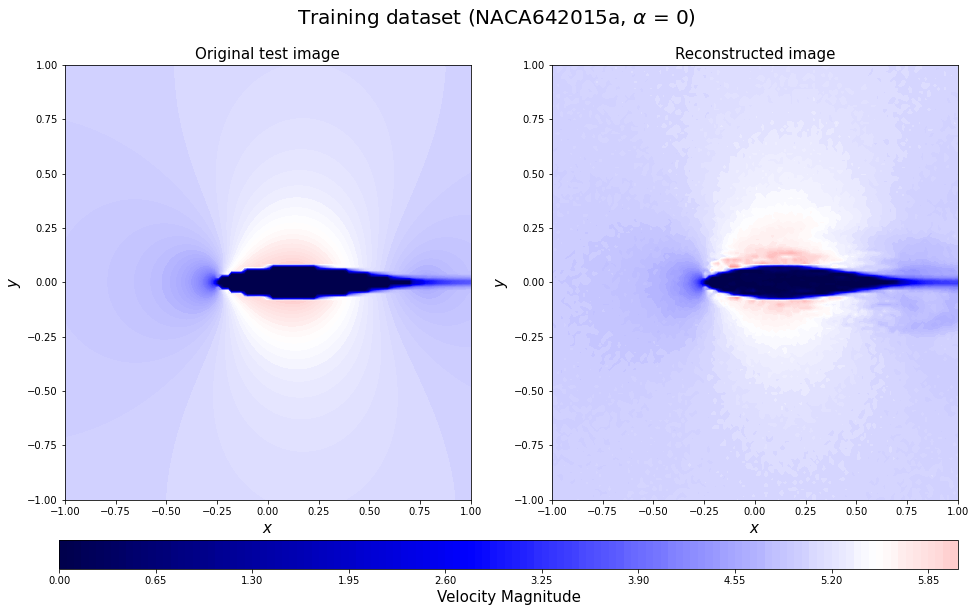

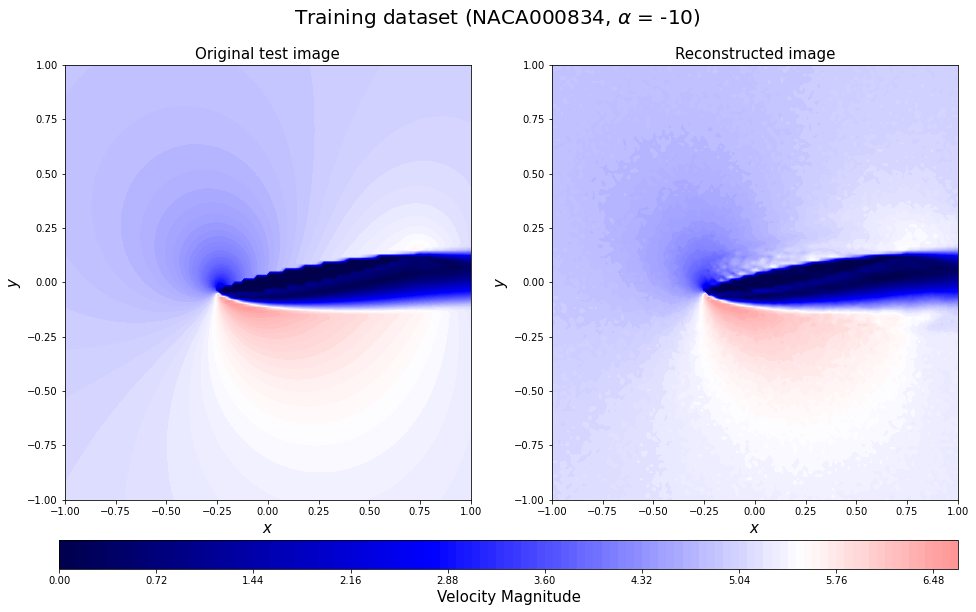

In [87]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train20_rotate = y_train[20*16+c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_train[20*16+c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train20_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[20*16+c])[3:-2], aa_train[20*16+c]),fontsize=20)
    save_fig_name = "20221107Prediction_UNet(training)"+str(np.array2string(geo_train[20*16+c])[3:-2])+str(aa_train[20*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

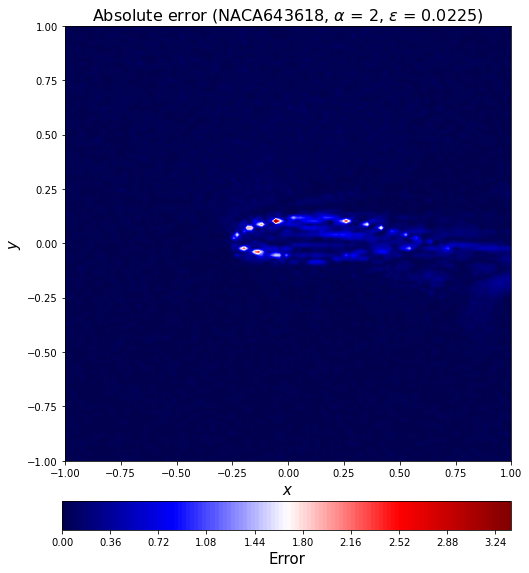

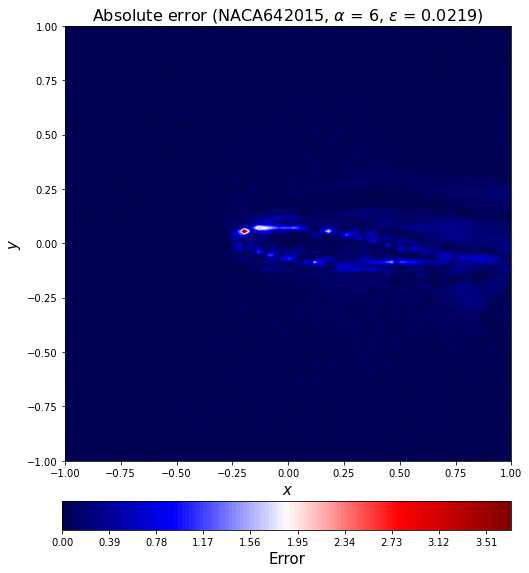

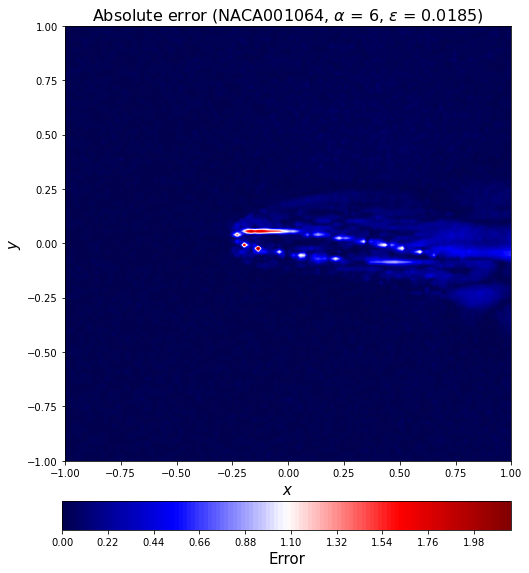

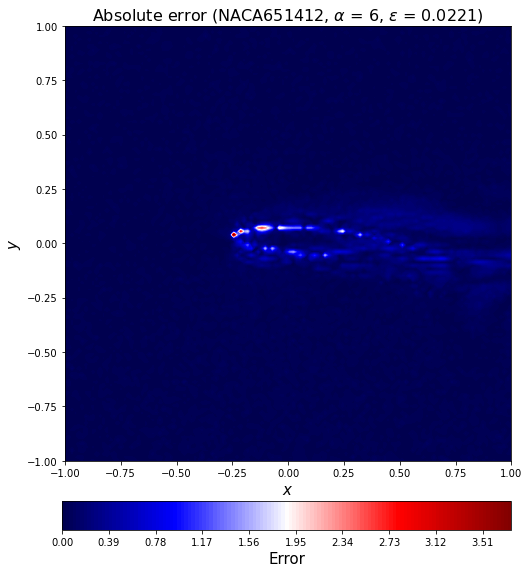

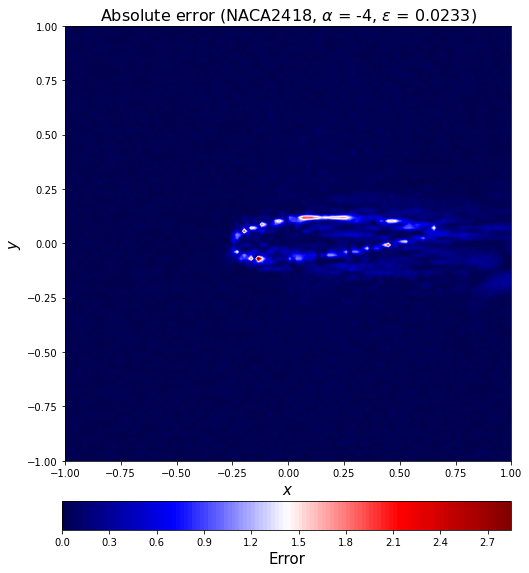

...

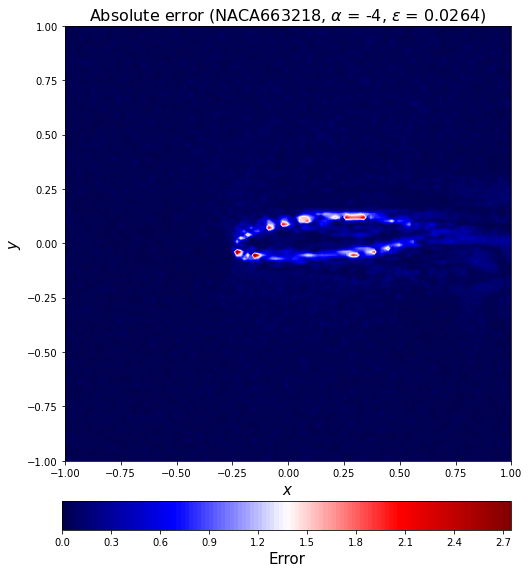

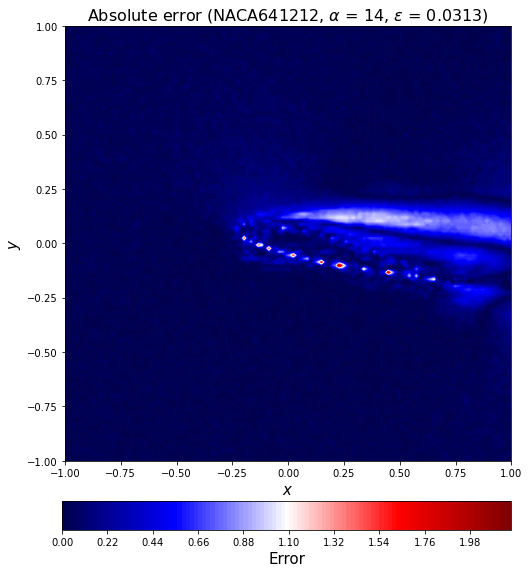

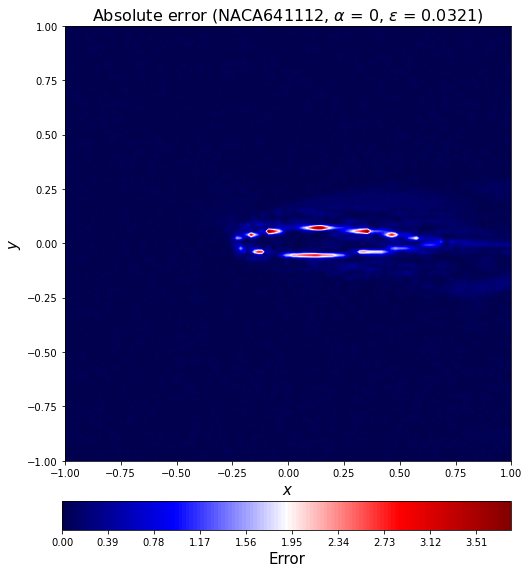

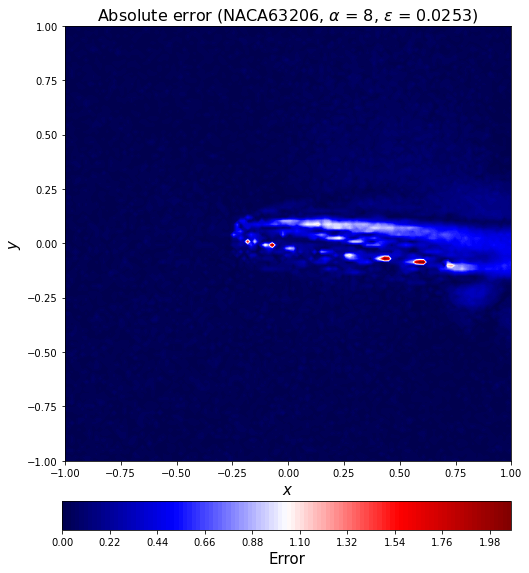

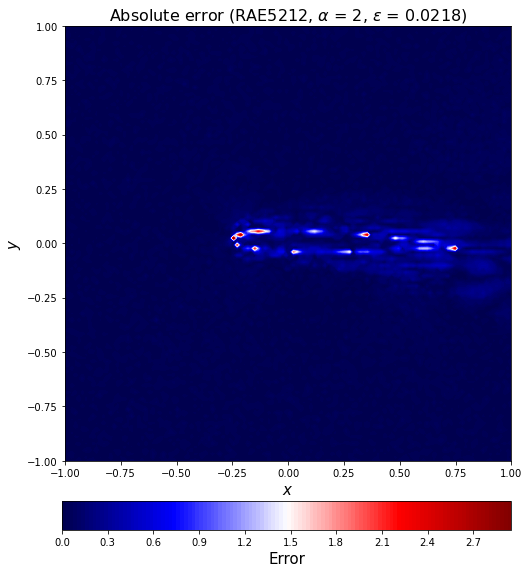

In [88]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[2*16+c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[2*16+c])[3:-2],
                                                                       aa_test[2*16+c], l2_error_test_list[2*16+c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_UNet(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

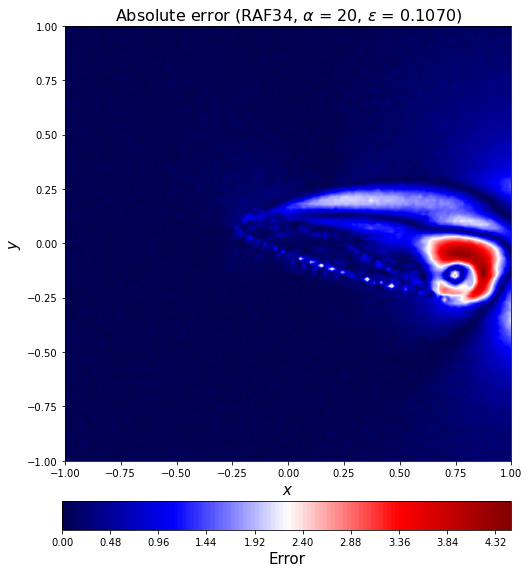

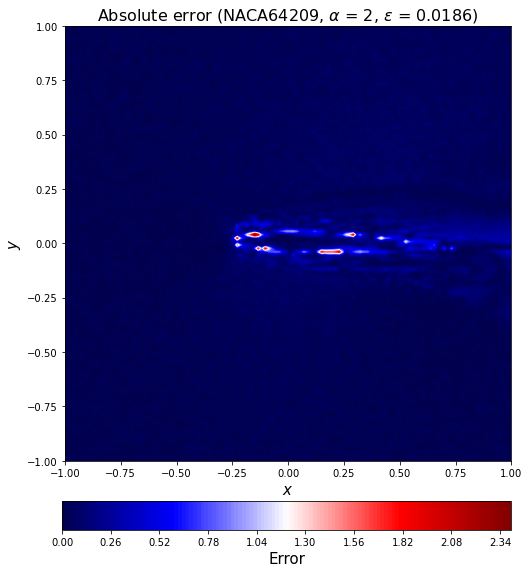

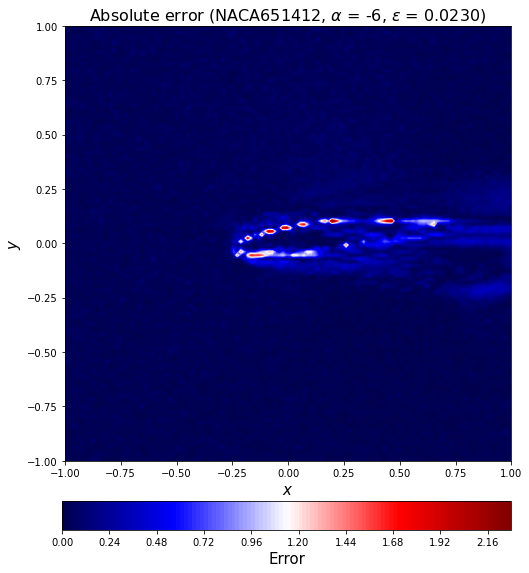

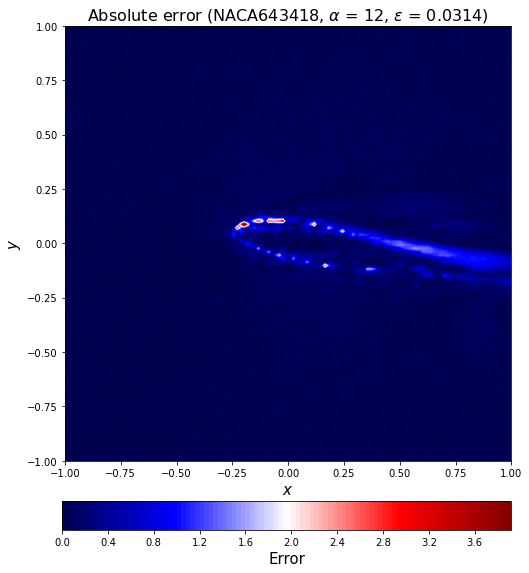

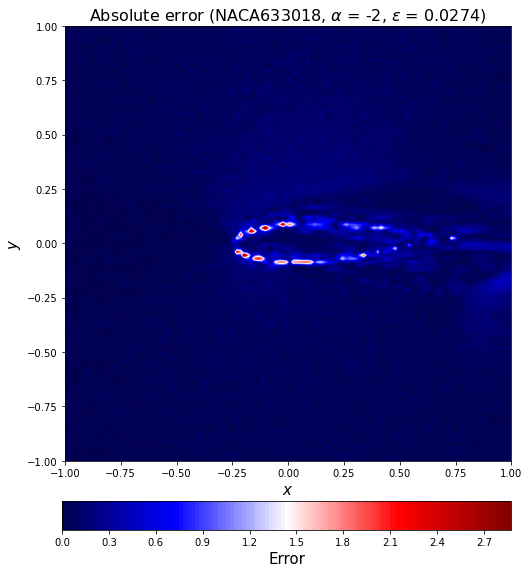

...

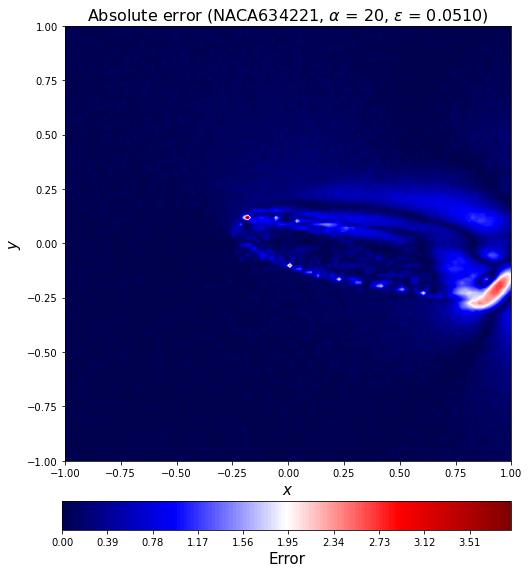

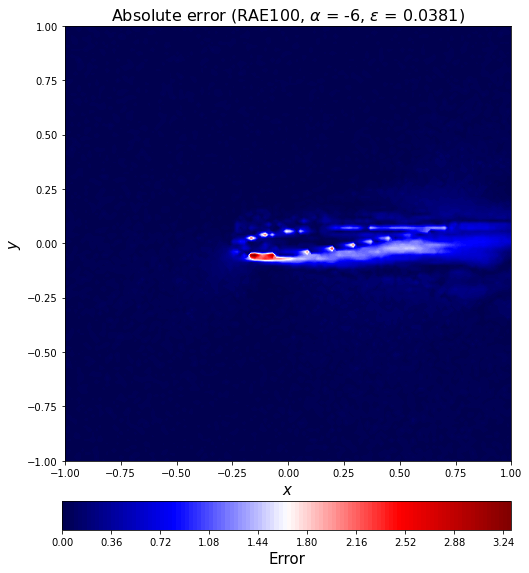

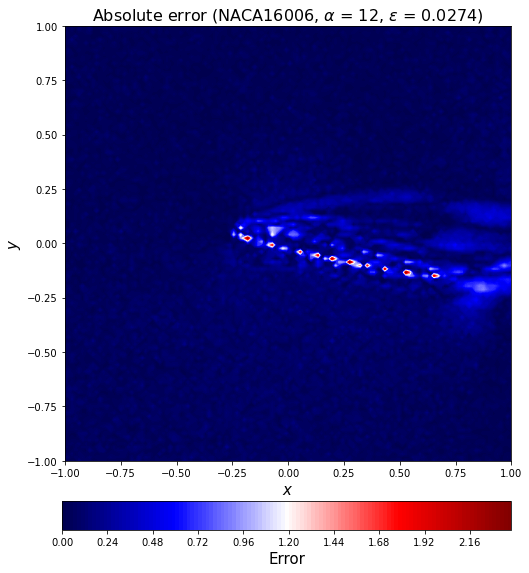

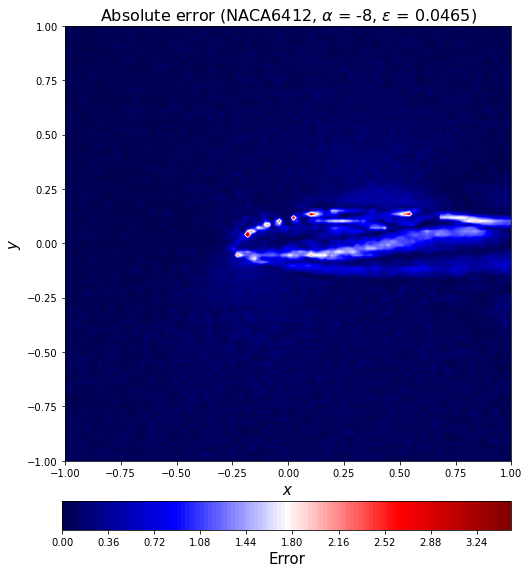

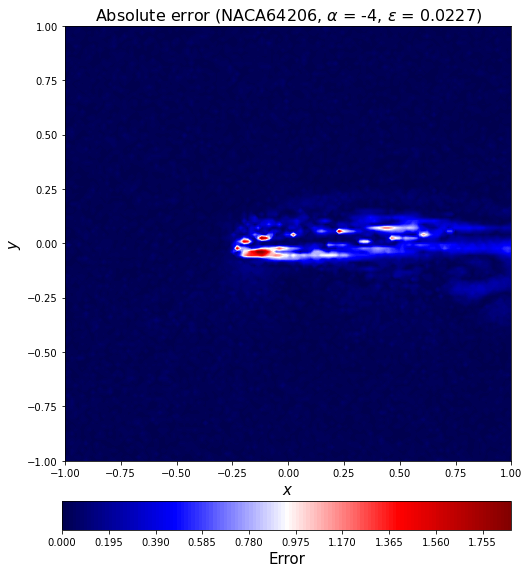

In [89]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_UNet(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

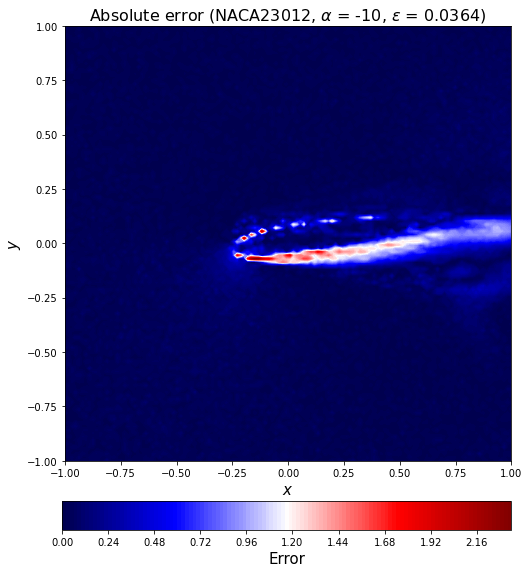

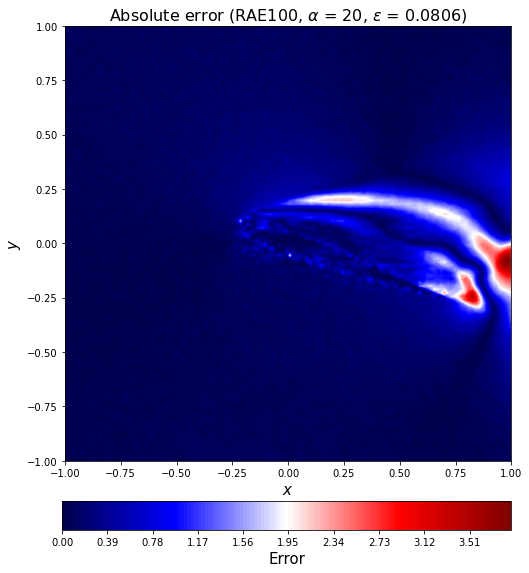

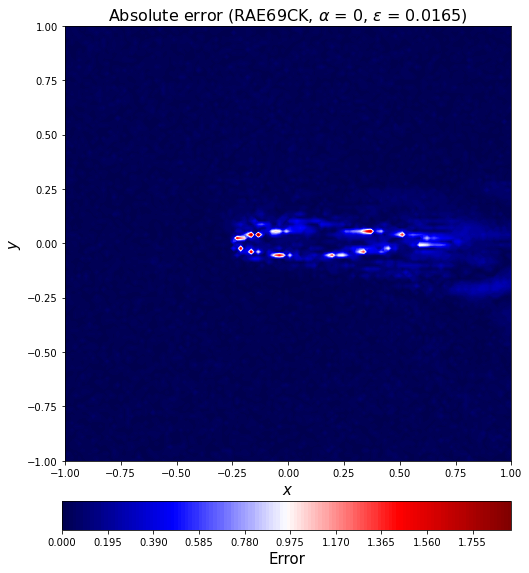

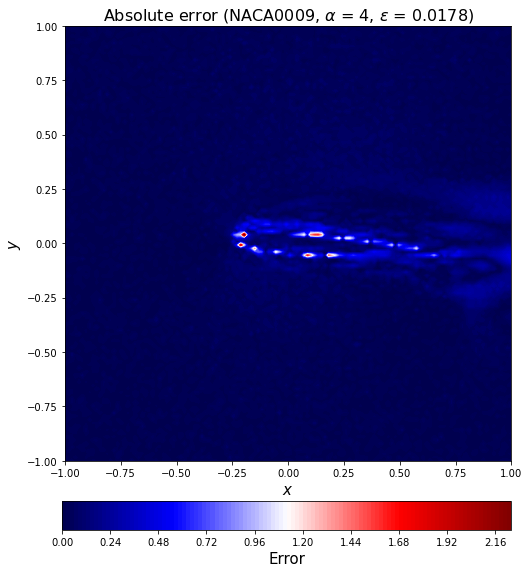

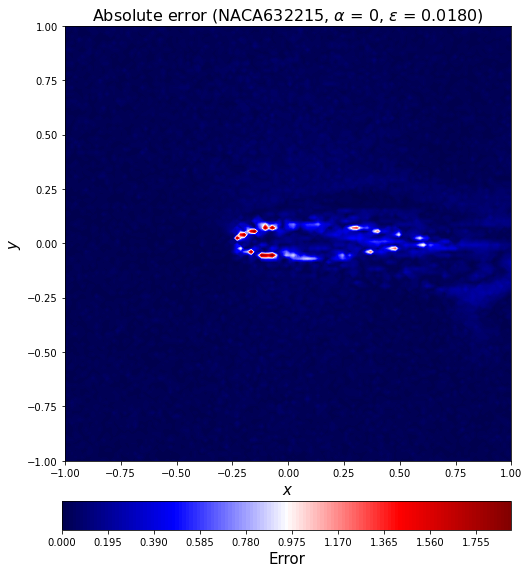

...

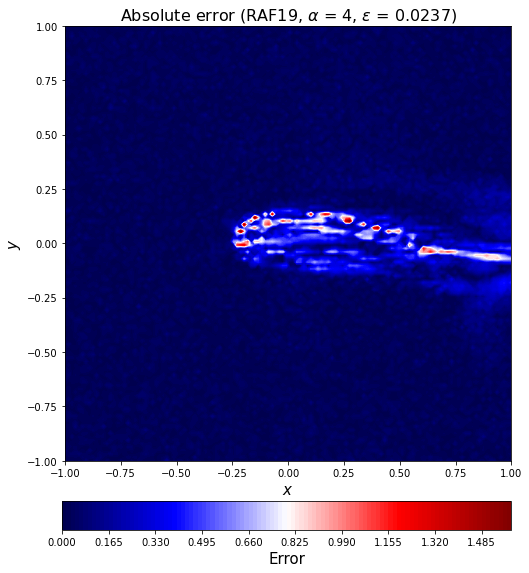

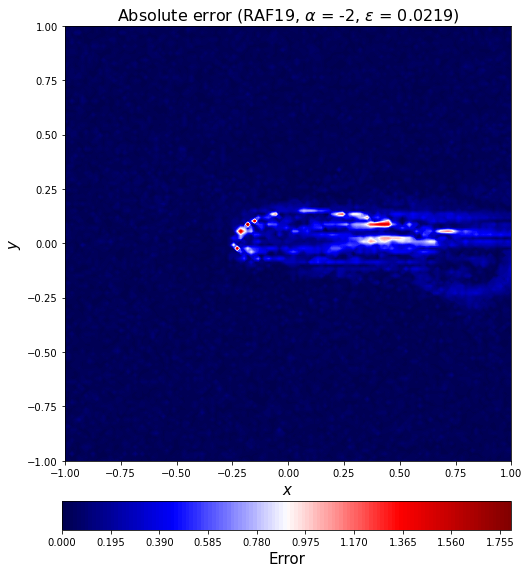

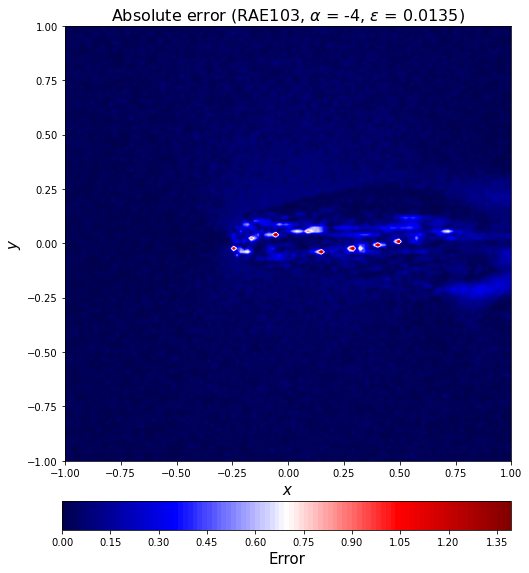

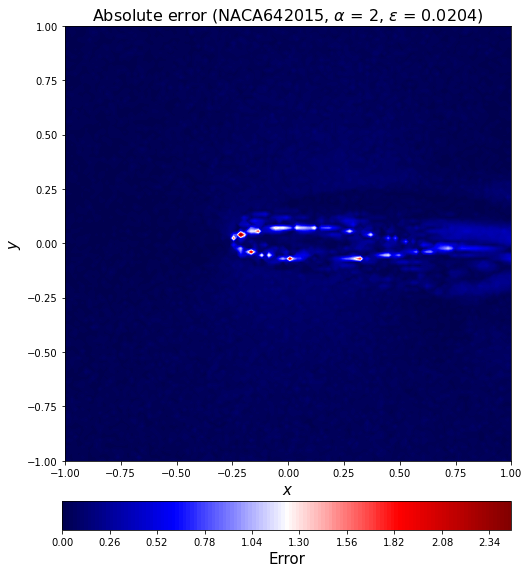

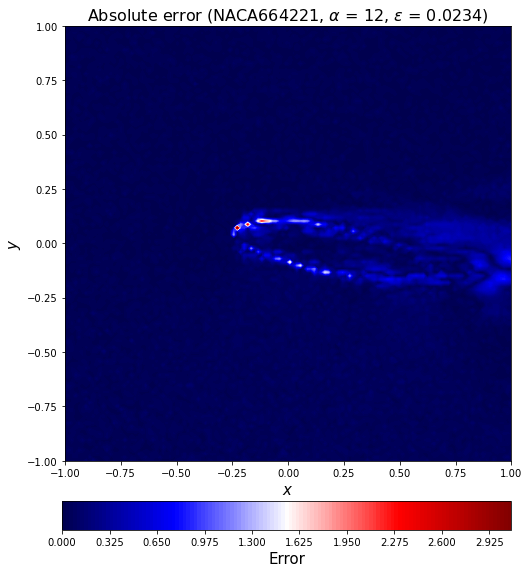

In [90]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[c])[3:-2],
                                                                             aa_train[c], l2_error_train_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_UNet(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

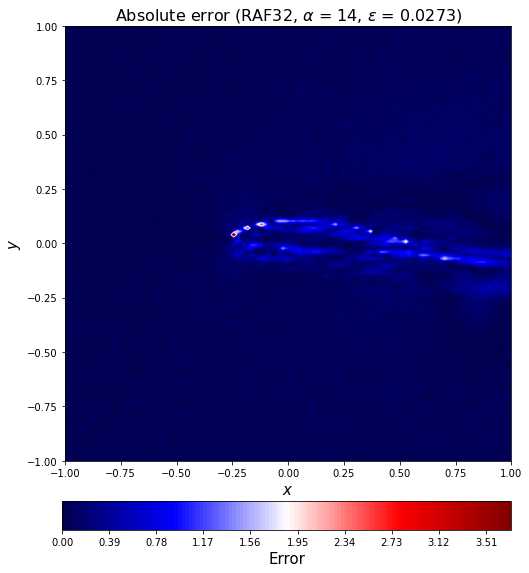

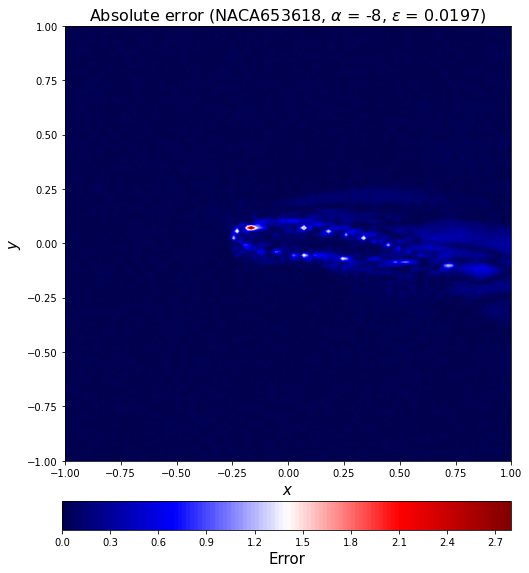

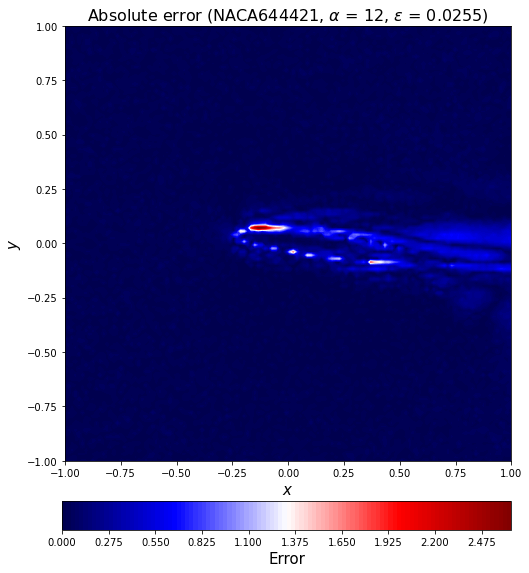

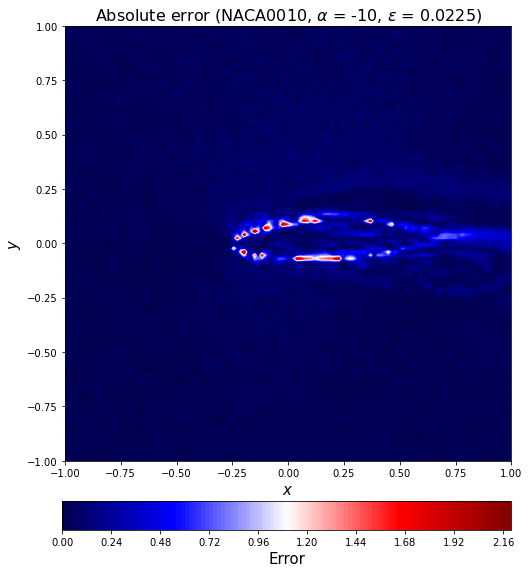

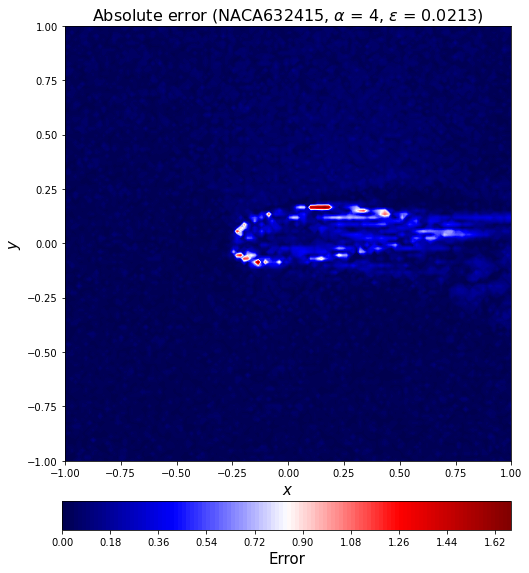

...

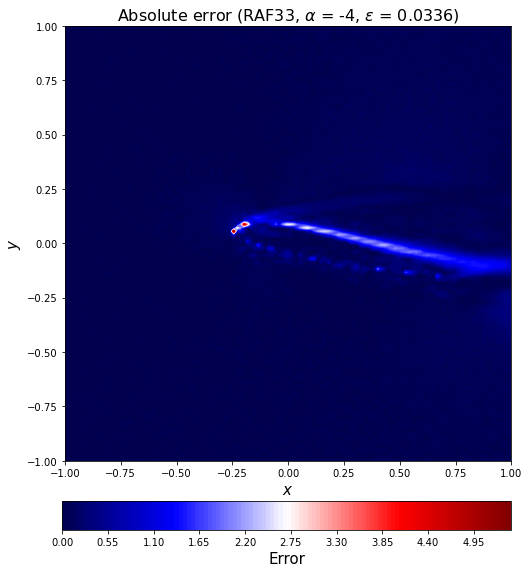

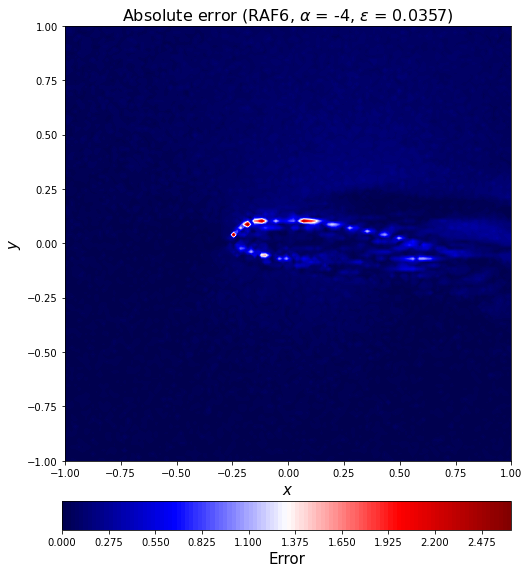

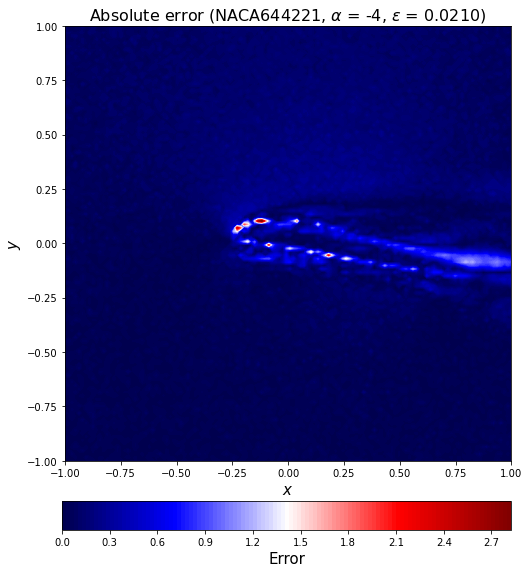

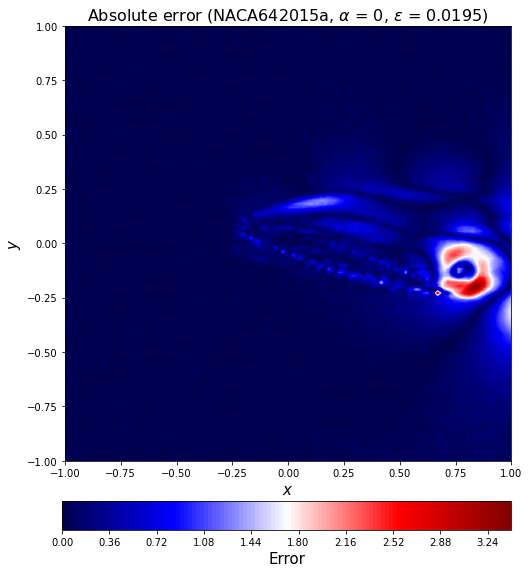

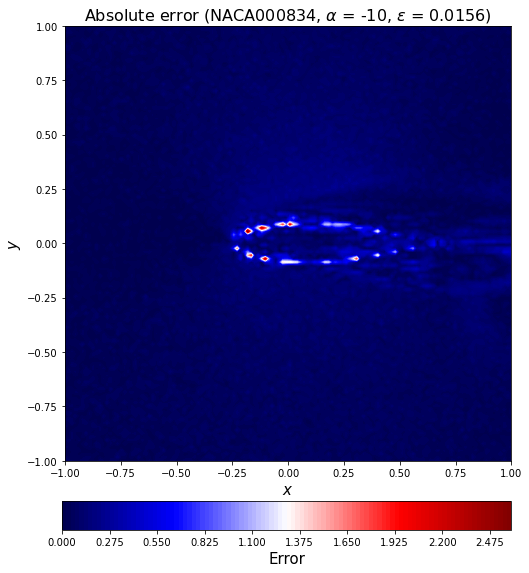

In [91]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[11*20+c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[16*20+c])[3:-2],
                                                                             aa_train[16*20+c], l2_error_train_list[16*20+c]),fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_UNet(training)"+str(np.array2string(geo_train[16*20+c])[3:-2])+str(aa_train[16*20+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()